## Exploratory 
### Adapted from Greg's code

In [5]:
.libPaths("/home/jupyter/lib")
library(tidyverse)
library(UpSetR)
library(cowplot)
library(patchwork)
library(ggpubr)
library(data.table)
fig.size <- function (height, width) {
    options(repr.plot.height = height, repr.plot.width = width)
}
panel <- "PM1"
base_dir <- glue::glue("../../FH3/flow/{panel}-unsupervised-clustering/output/")
icesTAF::mkdir(file.path(base_dir, "stats"))

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.6     ✔ stringr 1.4.0
✔ tidyr   1.2.0     ✔ forcats 0.5.1
✔ readr   2.1.2     

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘patchwork’


The following object is masked from ‘package:cowplot’:

    align_plots



Attaching package: ‘ggpubr’


The following object is masked from ‘package:cowplot’:

    get_legend



Attaching package: ‘data.table’


The following object is masked from ‘package:purrr’:

    transpose


The following objects are masked from ‘package:dplyr’:

    between, first, last




## load subject and sample metadata and merge by pbmc_sample_id

In [251]:
# merge in metadata by pbmc_sample_id
subjectmeta<-data.table::fread("/home/jupyter/FH3/flow/sample_meta_FH3.tsv") 
subjectmeta$pbmc_sample_id<-gsub("_202[0-1].*|.*P[0-9]_","",subjectmeta$file.name)
subjectmeta <- subjectmeta %>% mutate(PBID = gsub("-[0-9]*","",pbmc_sample_id)) %>% 
                                filter(file.panel == panel)
subjectmeta$PBID <- str_split(subjectmeta$PBID, "\\_") %>% 
  map_chr(~ paste0(.[3:3], collapse = "_")) %>% str_extract("[^-]*")
subjectmeta$age_bin <- str_replace(subjectmeta$age_bin, "eradults", "") %>% 
                                factor(levels = c("young", "old"))

In [254]:
# read in flowsom data and clean
celltype_freq<-read_csv(paste0(base_dir, glue::glue("{panel}_unsup{panel}_freq_norm_pm1_final_normalized_all_samples_frequency.csv"))) %>% rename(pbmc_sample_id = sample_id) %>% mutate(PBID = gsub("-[0-9]*","",pbmc_sample_id))
celltype_freq_meta <- left_join(celltype_freq,subjectmeta,by = "PBID")
celltype_freq_meta$age_bin <- str_replace(celltype_freq_meta$age_bin, "eradults", "") %>% 
                                factor(levels = c("young", "old"))
## select debris clusters to remove from dataset.
remove_debris<-grep("debris",unique(celltype_freq_meta$FlowSOM_meta_spe_anno),value=T)
celltype_freq_meta <- celltype_freq_meta %>% 
    filter(sample_type == "sample" & !(FlowSOM_meta_spe_anno %in% remove_debris) & file.panel == panel)

Rows: 4631 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (5): sample_id, FlowSOM_meta_spe_anno, batch, sample_type, Population
dbl (4): N, freq_live, FlowSOM_cluster_spe, FlowSOM_meta_spe

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [255]:
celltype_freq_meta$FlowSOM_meta_spe_anno <- recode(celltype_freq_meta$FlowSOM_meta_spe_anno,
                                           "2_intermediate monocytes" = "2_CD16+ Monocytes",
                                           "13_intermediate monocytes" = "13_CD16+ Monocytes",
                                           "12_intermediate monocytes" = "12_CD16+ Monocytes")

## Compare flowSOM cell % to hand gated cell %

In [256]:
celltype_freq_meta <- celltype_freq_meta %>% mutate(celltype = str_extract(FlowSOM_meta_spe_anno, "[^_]+$")) %>%
                      group_by(PBID, celltype) %>% mutate(avg_celltype = sum(freq_live))
celltype_freq_meta <- celltype_freq_meta %>% mutate(Status = recode(Status,
                                                                   "Covid" = "COVID",
                                                                   "Healthy" = "Uninfected"))

In [257]:
covid_fhand <- data.table::fread("/home/jupyter/FH3/flow/Covid_flow_data_final.csv")


In [258]:
# clean-up hand gated data
names(covid_fhand) <- make.names(names(covid_fhand))
covid_flow_hand <- covid_fhand %>% 
                    mutate_each(funs(./Total), NK.Cells:Basophils)

# clean-up flowsom data
nk_group <- celltype_freq_meta %>% 
                group_by(pbmc_sample_id.x) %>% 
                filter(celltype %in% grep("NK", celltype_freq_meta$celltype, value = T)) %>% 
                mutate(avg_celltype = sum(freq_live), celltype_nice = "NK.Cells") 

In [259]:
# prepare and merge percentages

cfh_melt <- covid_flow_hand %>% reshape2::melt()
flowsom_melt <- celltype_freq_meta %>% mutate(celltype_nice = make.names(celltype)) %>% 
    mutate(celltype_nice=recode(celltype_nice, 
                         "intermediate.monocytes" = "Intermediate.monocytes")
          )
    
flowsom_melt <- rbind(flowsom_melt, nk_group)
merge_melt <- inner_join(cfh_melt, flowsom_melt, by = c("patientID_Visit" = "PTID_visit", "variable" = "celltype_nice"))

Using patientID_Visit as id variables



In [260]:
#merge_melt$FlowSOM_meta_spe_anno %>% unique()


`geom_smooth()` using formula 'y ~ x'



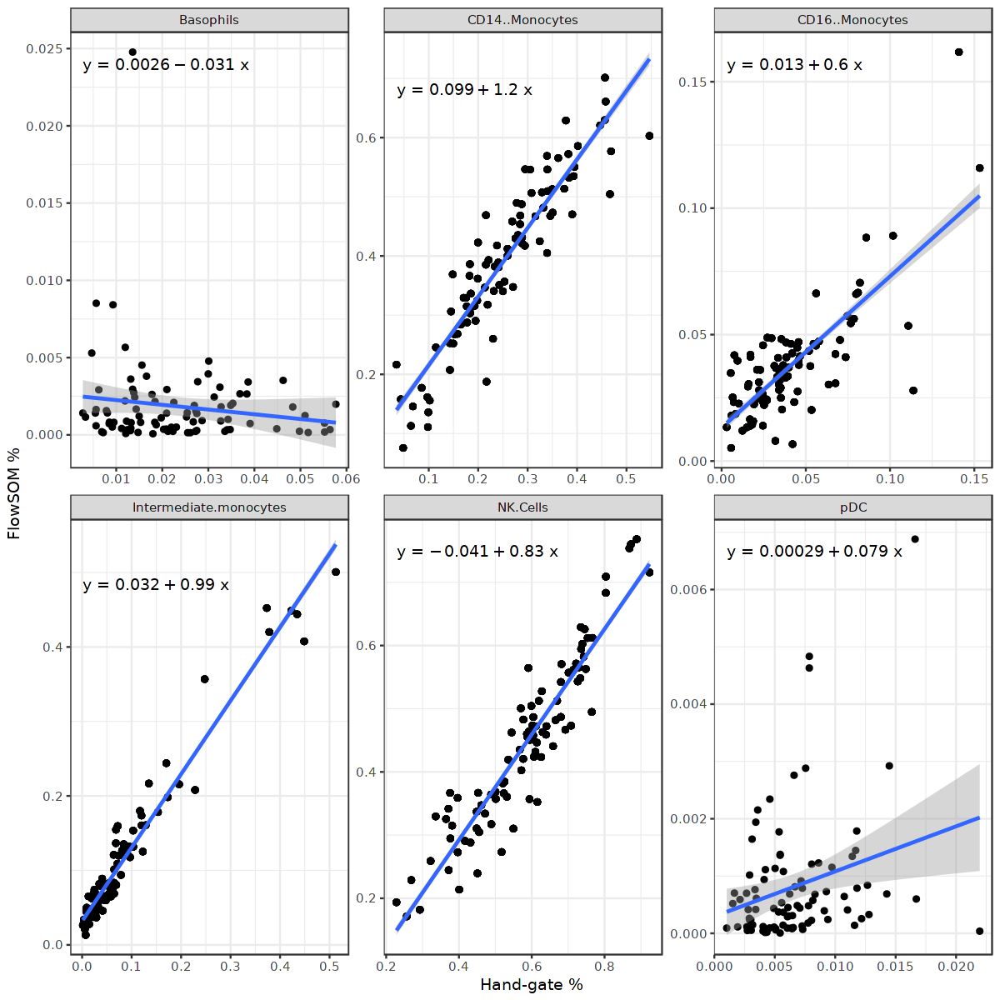

In [261]:
# correlations
fig.size(10,10)
ggplot(merge_melt, aes(x=value, y=avg_celltype)) + 
  geom_point()+
  geom_smooth(method=lm) +
  xlab("Hand-gate %") + 
  ylab("FlowSOM %") + 
  facet_wrap(~variable, scales="free") + 
  stat_regline_equation() + 
  theme_bw()

## Heatmap of MFI to find clusters to collapse

In [262]:
mfi <- read_csv(paste0(base_dir, glue::glue("{panel}_unsup{panel}_fm_norm_pm1_final_normalized_all_samples_MFI.csv"))) %>% rename(pbmc_sample_id = sample_id) %>% mutate(PBID = gsub("-[0-9]*","",pbmc_sample_id))


Rows: 4631 Columns: 24
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (2): sample_id, FlowSOM_meta_spe_anno
dbl (22): CD14_logicle_aligned, CD15_logicle_aligned, CD56_logicle_aligned, ...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


In [327]:
# prep MFI means
mfi_long <- mfi %>% pivot_longer(cols = CD14_logicle_aligned:CD1c_logicle_aligned,names_to = "markers",values_to = "mfi") %>%
                    mutate(markers = str_replace(markers, "_logicle_aligned", ""))
   
mfi_meta <- left_join(mfi_long,subjectmeta,by = "PBID") %>% filter(!(grepl("IMM19",PBID))) %>% 
                                mutate(Status = recode(Status,
                                                            "Covid" = "COVID",
                                                            "Healthy" = "Uninfected")) %>%
                                select(-contains("panel")) %>% distinct() %>%
                                filter(!(FlowSOM_meta_spe_anno %in% remove_debris))

mfi_meta$age_bin <- str_replace(mfi_meta$age_bin, "eradults", "") %>% 
                                factor(levels = c("young", "old")) 


# by cell type
mfi_meta <- mfi_meta %>% mutate(celltype = str_extract(FlowSOM_meta_spe_anno, "[^_]+$")) %>%
                      group_by(PBID, markers, celltype) %>% mutate(avg_mfi = mean(mfi))

mfi_celltype <- mfi_meta %>% select(c(avg_mfi, mfi, Stage, markers, age_bin, Status, FlowSOM_meta_spe_anno)) %>% distinct()

Adding missing grouping variables: `PBID`, `celltype`


In [266]:
# prep heatmap mats
clus_hm_mat <- mfi_celltype %>% 
    group_by(FlowSOM_meta_spe_anno, markers) %>%
    summarise(mean_cluster = mean(mfi)) %>%
    pivot_wider(names_from = markers, values_from = mean_cluster) 

celltype_hm_mat <- mfi_celltype %>% 
    group_by(celltype, markers) %>%
    summarise(mean_cluster = mean(avg_mfi)) %>%
    pivot_wider(names_from = markers, values_from = mean_cluster) 

celltype_hm_mat <- setNames(celltype_hm_mat, colnames(clus_hm_mat))
hm_mat <- celltype_hm_mat %>%
    filter(FlowSOM_meta_spe_anno %in% c("CD14+ Monocytes", "CD16+ Monocytes","intermediate monocytes", "CD56mid CD16+ NK cells")) %>%
    rbind(clus_hm_mat) %>%
    column_to_rownames(var="FlowSOM_meta_spe_anno")


`summarise()` has grouped output by 'FlowSOM_meta_spe_anno'. You can override
using the `.groups` argument.
`summarise()` has grouped output by 'celltype'. You can override using the
`.groups` argument.


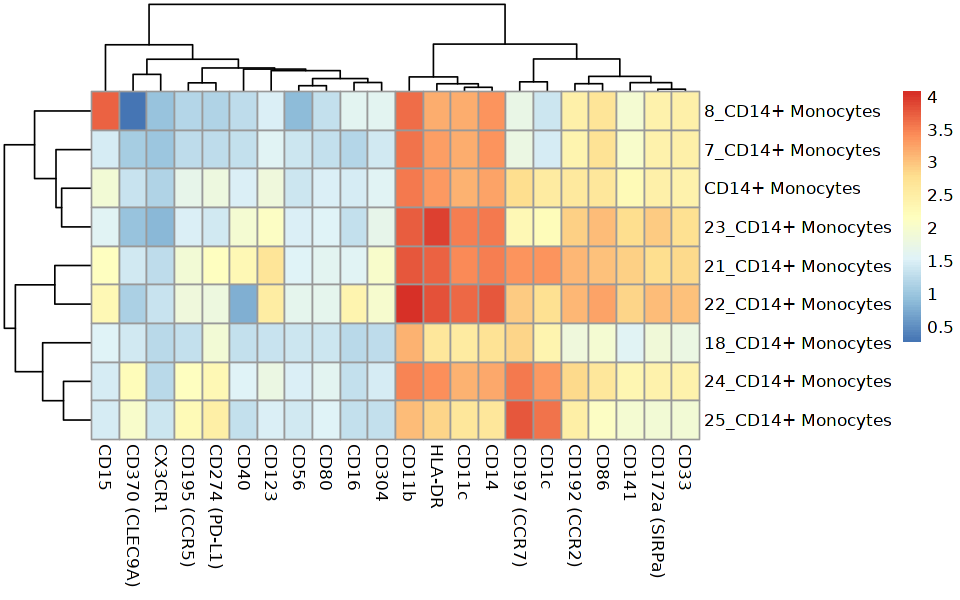

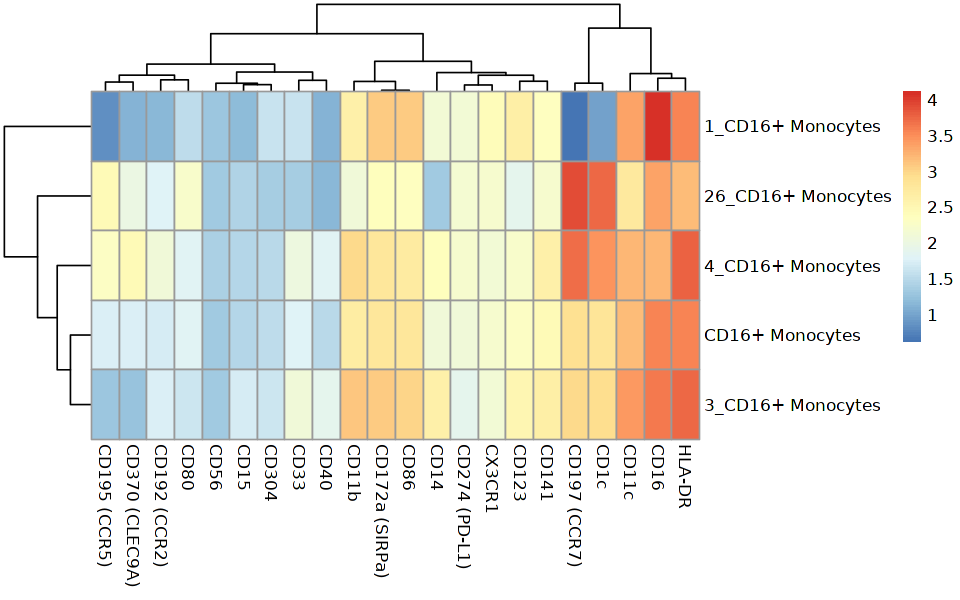

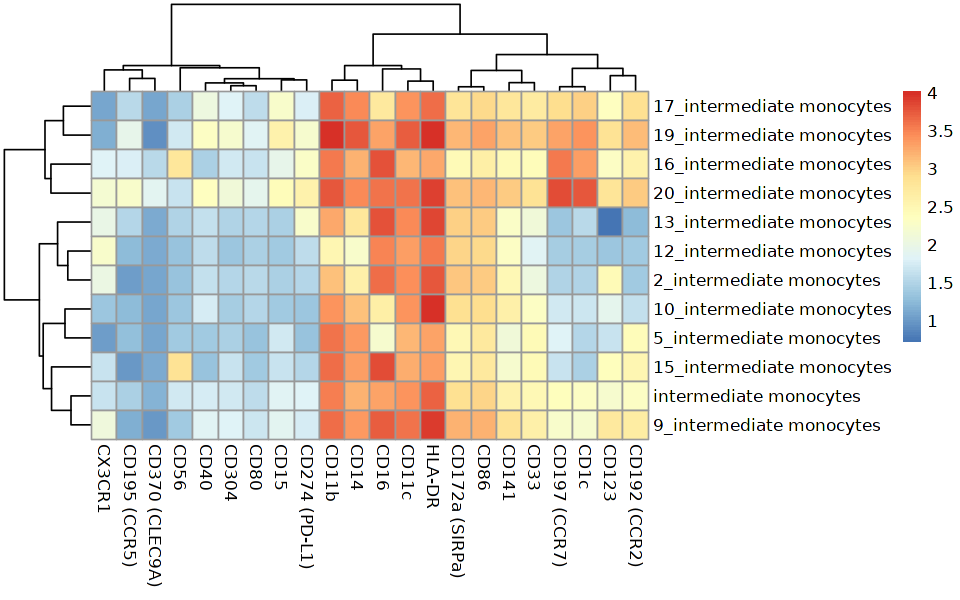

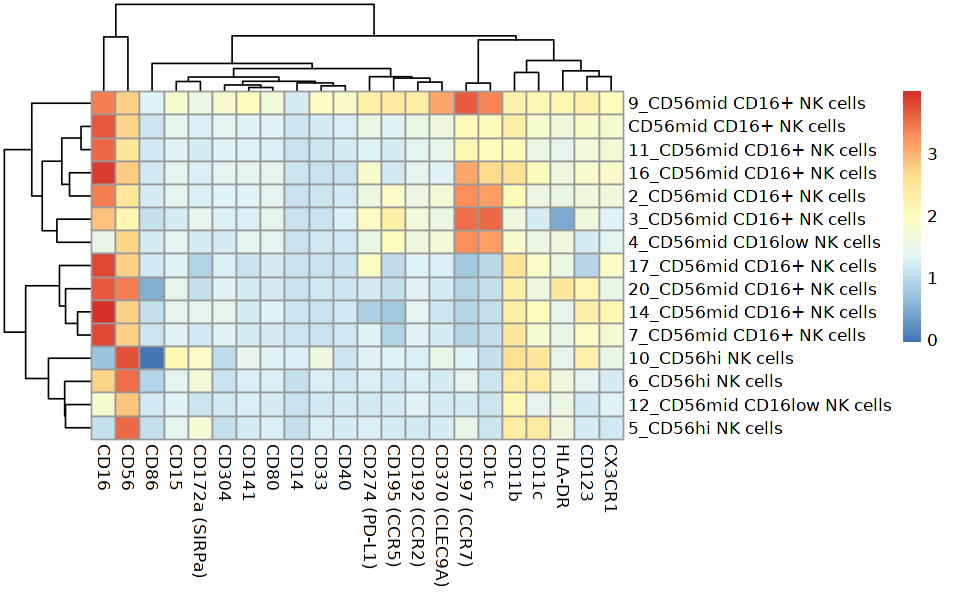

In [267]:
fig.size(5,8)
hm_mat %>%
    filter(grepl("CD14", rownames(hm_mat))) %>%
    pheatmap::pheatmap()
hm_mat %>%
    filter(grepl("CD16.*Mono", rownames(hm_mat))) %>%
    pheatmap::pheatmap()
hm_mat %>%
    filter(grepl("intermediate", rownames(hm_mat))) %>%
    pheatmap::pheatmap()
hm_mat %>%
    filter(grepl("NK", rownames(hm_mat))) %>%
    pheatmap::pheatmap()

## Check MFI for CD14/CD16 clusters

In [185]:
grep("intermediate", clusters_unique[idx], value = T)
#head(check_mfi)
c <- mfi_long %>% filter(markers %in% c("CD14", "CD16")) %>% 
     group_by(FlowSOM_meta_spe_anno, markers) %>% 
     mutate(grp.mean = mean(mfi))


[1] "10_intermediate monocytes" "12_intermediate monocytes"
 [3] "13_intermediate monocytes" "15_intermediate monocytes"
 [5] "16_intermediate monocytes" "17_intermediate monocytes"
 [7] "19_intermediate monocytes" "2_intermediate monocytes" 
 [9] "20_intermediate monocytes" "5_intermediate monocytes" 
[11] "9_intermediate monocytes"

In [232]:
scatter <- mfi_all_cell %>% select(c("CD14_logicle_aligned", "CD16_logicle_aligned", "FlowSOM_meta_spe_anno"))
colnames(scatter) <- str_replace(colnames(scatter), "_logicle_aligned", "")

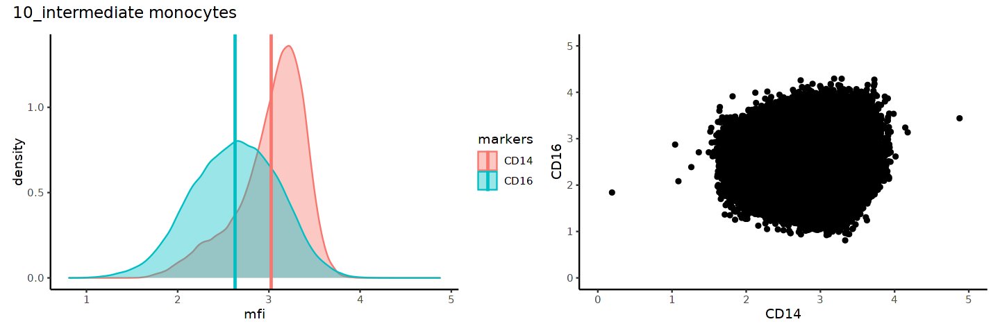

Warning message:
“Removed 3 rows containing missing values (geom_point).”


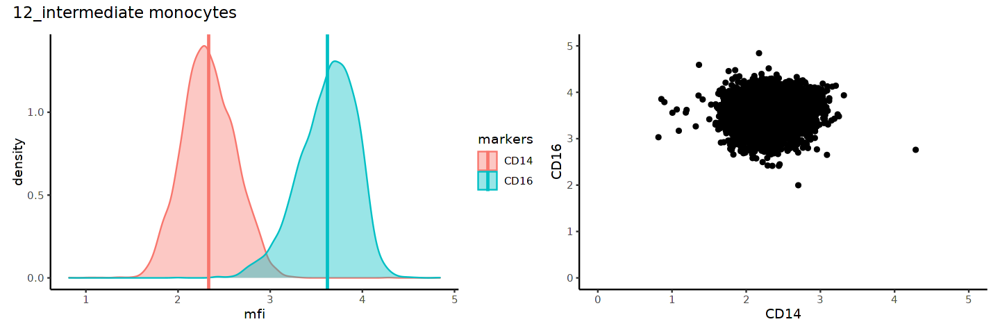

Warning message:
“Removed 1 rows containing missing values (geom_point).”


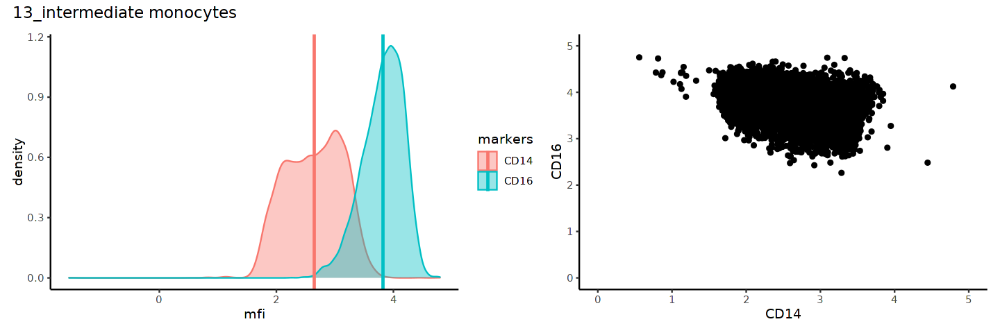

Warning message:
“Removed 1 rows containing missing values (geom_point).”


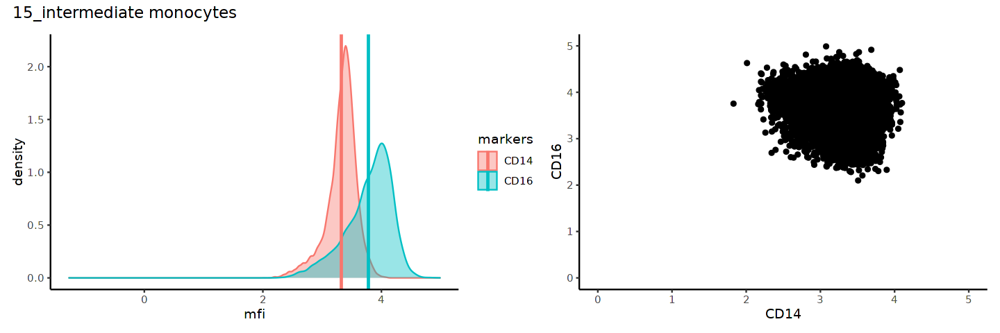

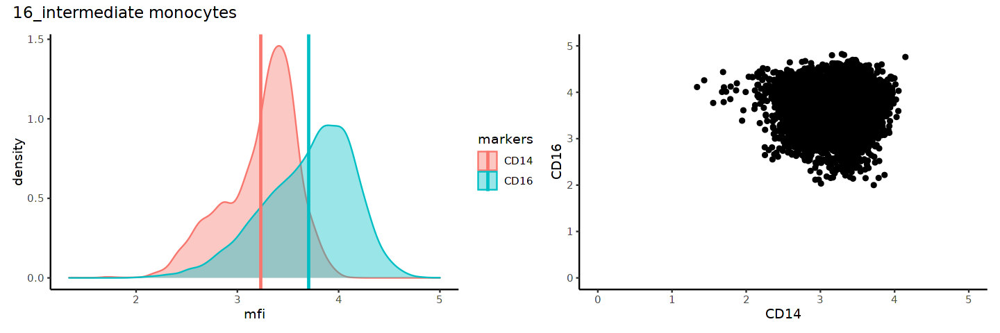

Warning message:
“Removed 2 rows containing missing values (geom_point).”


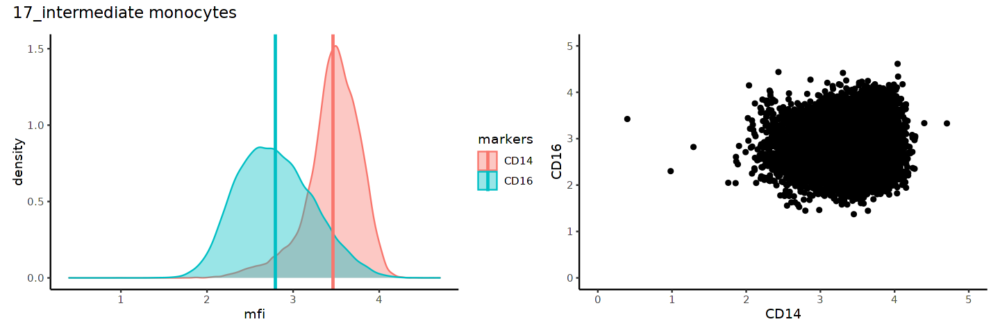

Warning message:
“Removed 1 rows containing missing values (geom_point).”


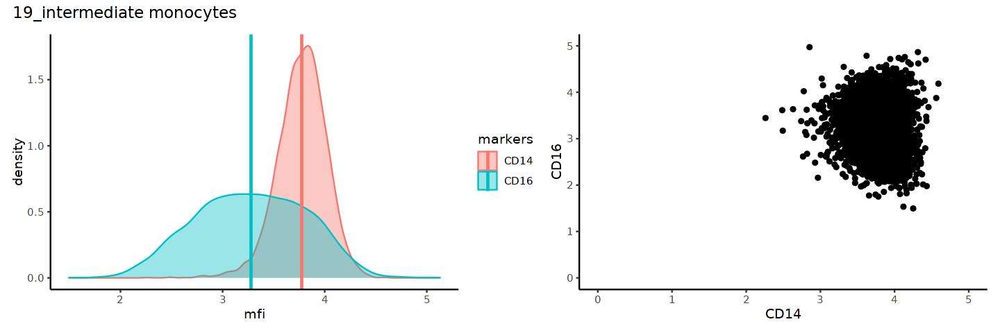

Warning message:
“Removed 7 rows containing missing values (geom_point).”


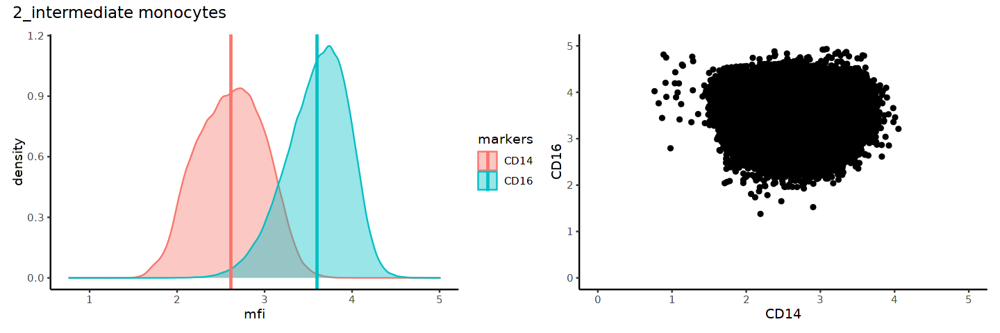

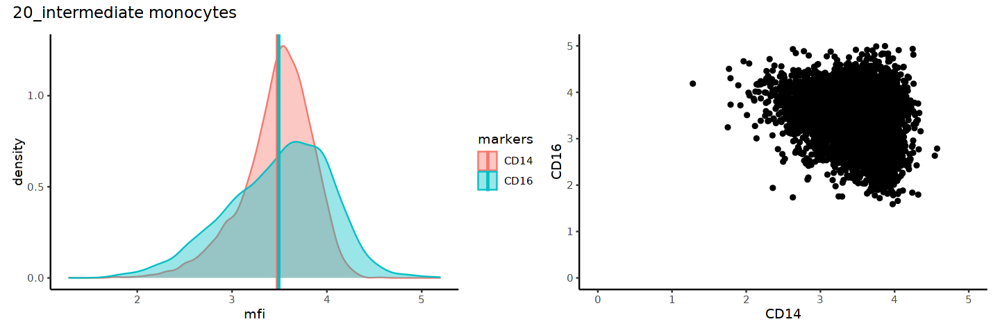

Warning message:
“Removed 4 rows containing missing values (geom_point).”


[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]


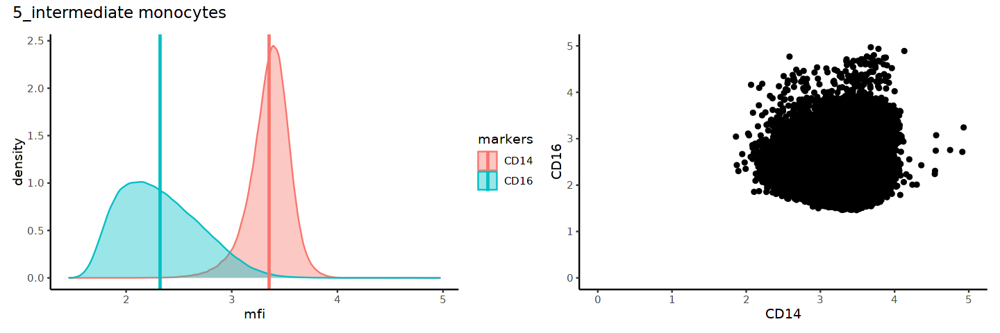

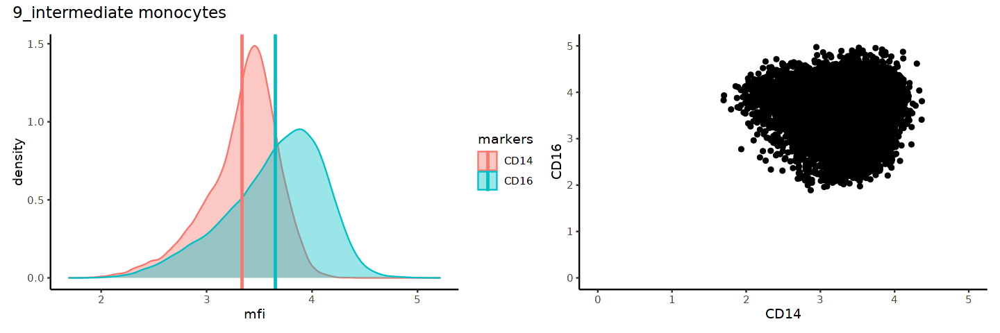

In [242]:
# intermediate monocytes
fig.size(4,12)
lapply(grep("intermediate", clusters_unique[idx], value = T), function(x){

    
    gg1 <- ggplot(c %>% filter(FlowSOM_meta_spe_anno == x & markers %in% c("CD14", "CD16")), aes(x=mfi, fill=markers, color=markers)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=markers),linetype="solid", size = 1) + 
        theme_classic()
    
    gg2 <- ggplot(scatter %>% filter(FlowSOM_meta_spe_anno == x), aes(x=CD14, y=CD16)) +
        geom_point() + 
        theme_classic() + 
        xlim(0,5) + 
        ylim(0,5)
    
    gg1 + gg2 + plot_annotation(title = x)

    })
    

Warning message:
“Removed 3 rows containing missing values (geom_point).”
Warning message:
“Removed 29 rows containing missing values (geom_point).”


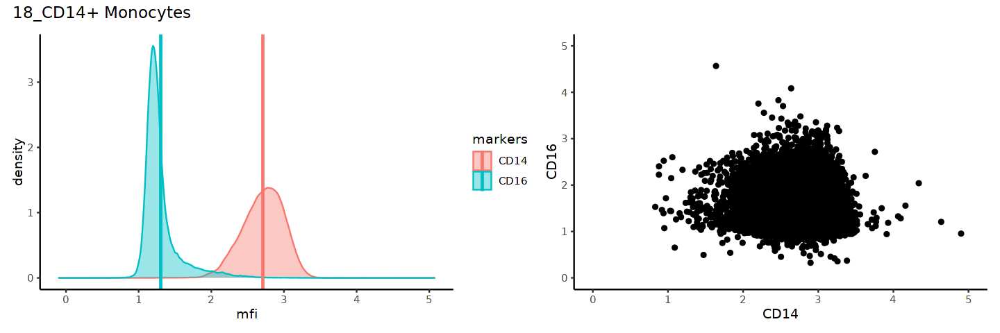

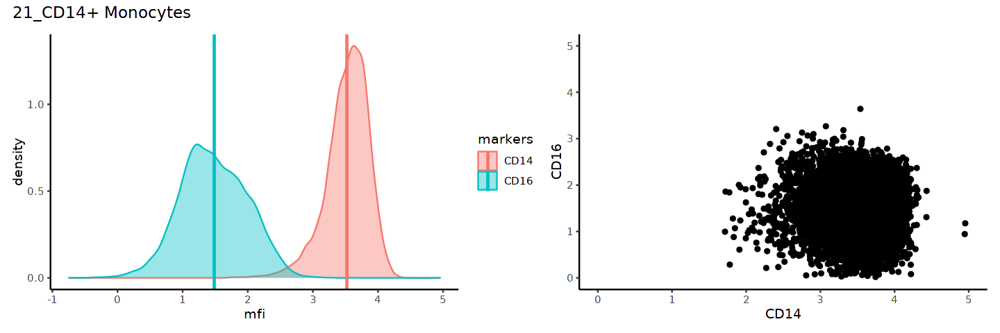

Warning message:
“Removed 7 rows containing missing values (geom_point).”


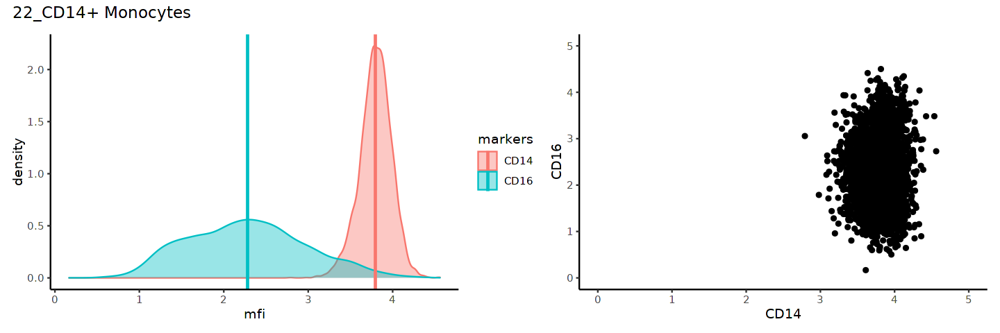

Warning message:
“Removed 7 rows containing missing values (geom_point).”


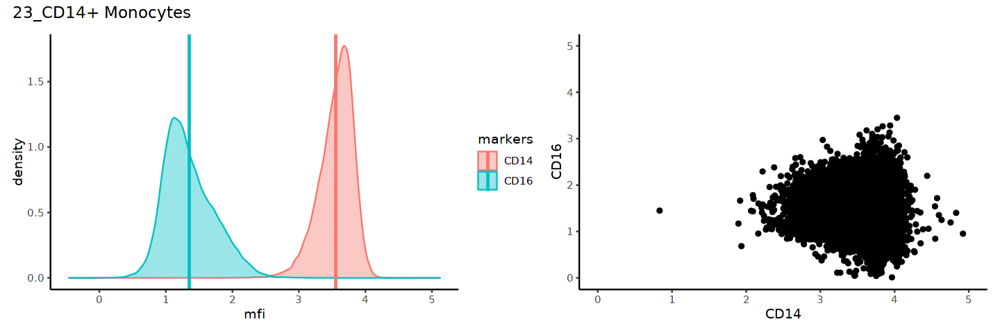

Warning message:
“Removed 9 rows containing missing values (geom_point).”


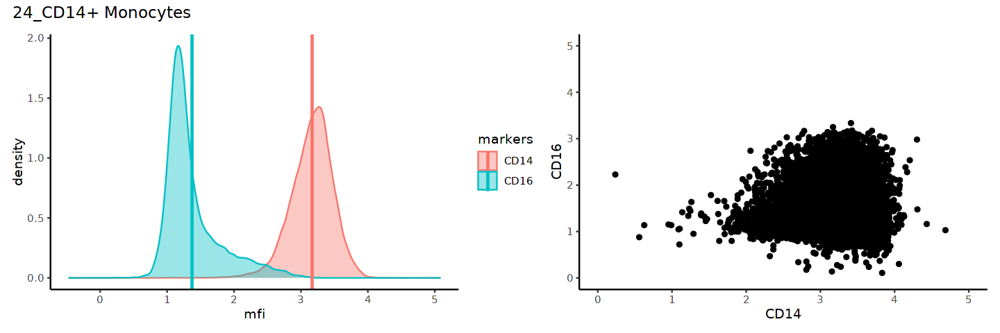

Warning message:
“Removed 32 rows containing missing values (geom_point).”


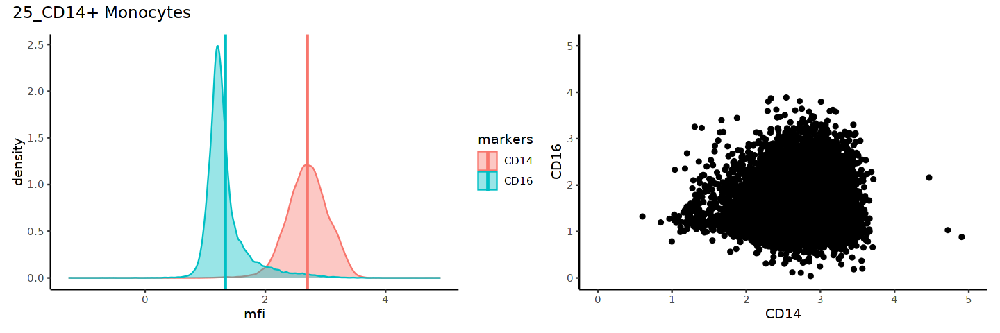

Warning message:
“Removed 2 rows containing missing values (geom_point).”


[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]


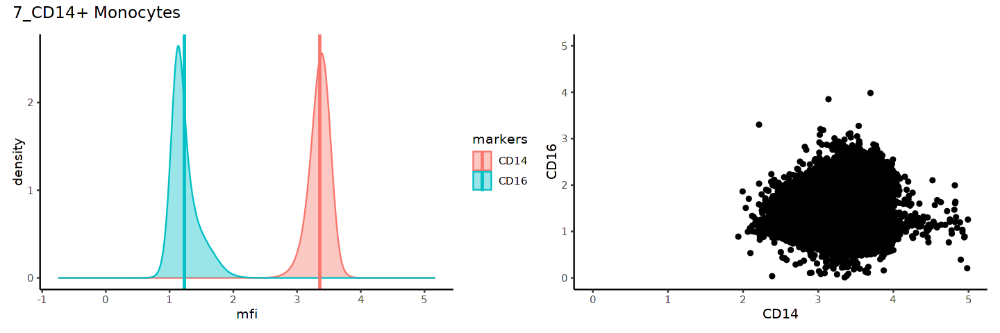

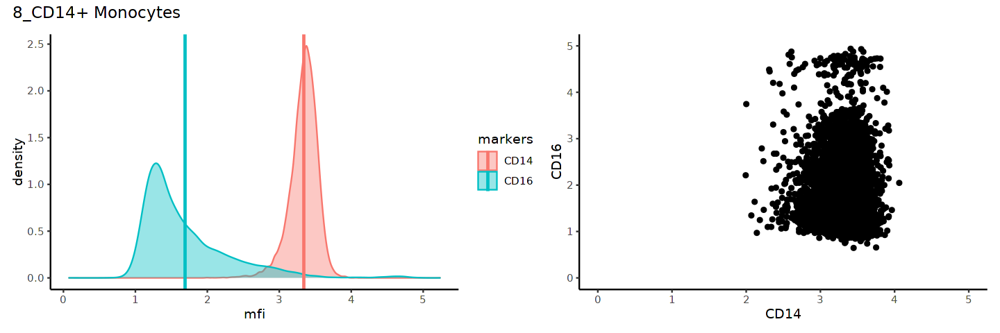

In [245]:
# CD14+ monocytes
fig.size(4,12)
lapply(grep("CD14", clusters_unique[idx], value = T), function(x){

    
    gg1 <- ggplot(c %>% filter(FlowSOM_meta_spe_anno == x & markers %in% c("CD14", "CD16")), aes(x=mfi, fill=markers, color=markers)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=markers),linetype="solid", size = 1) + 
        theme_classic()
    
    gg2 <- ggplot(scatter %>% filter(FlowSOM_meta_spe_anno == x), aes(x=CD14, y=CD16)) +
        geom_point() + 
        theme_classic() + 
        xlim(0,5) + 
        ylim(0,5)
    
    gg1 + gg2 + plot_annotation(title = x)

    })
    

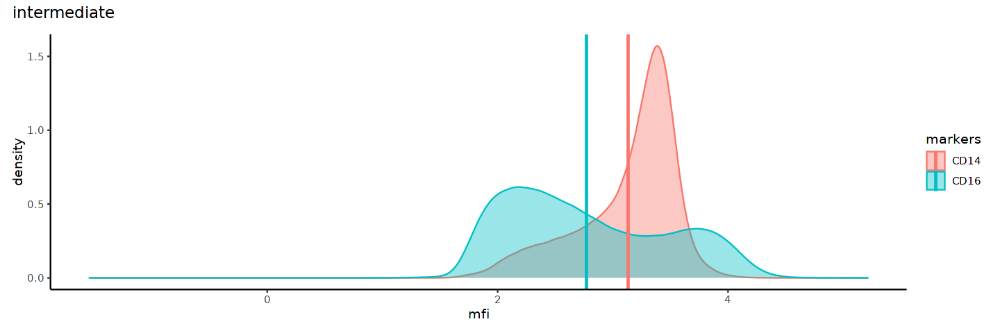

[[1]]

[[2]]

[[3]]


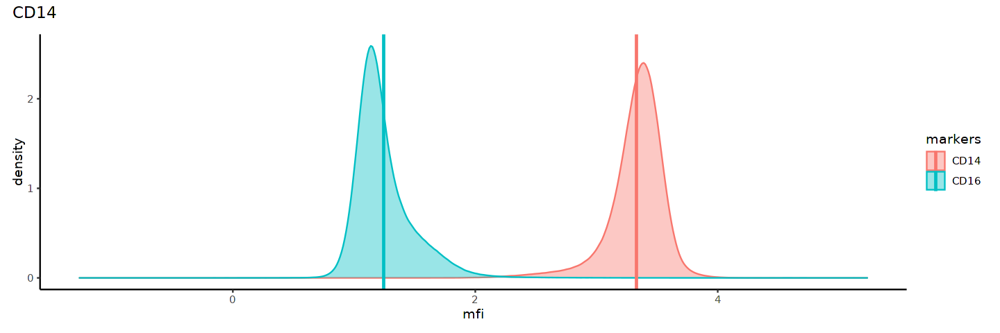

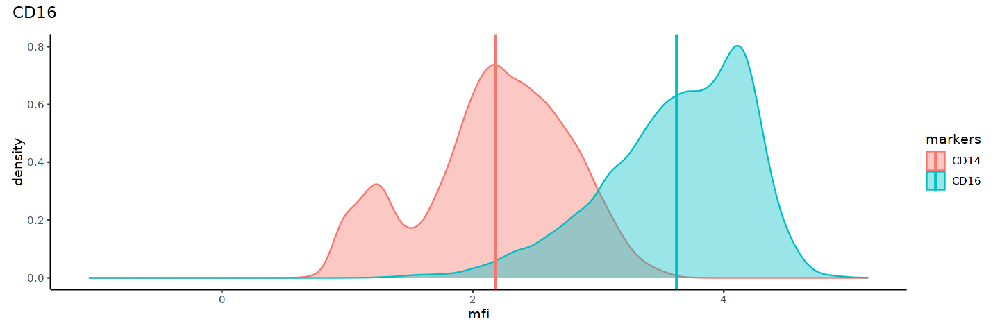

In [330]:
# check pooled populations
#marker = c("HLA-DR", "CD40", "CD197 (CCR7)", "CD1c")
lapply(c("intermediate", "CD14", "CD16.*Mono"), function(x){
    
    c <- mfi_all_long %>% filter(markers %in% c("CD14", "CD16") & grepl(x, FlowSOM_meta_spe_anno)) %>% 
     ungroup() %>% 
     group_by(markers) %>% 
     mutate(mfi_mean = mean(mfi))
    
    gg1 <- ggplot(c, aes(x=mfi, fill=markers, color=markers)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=mfi_mean, color=markers),linetype="solid", size = 1) + 
        theme_classic()
    
    x <- recode(x, "CD16.*Mono" = "CD16")
    gg1 + plot_annotation(title = x)

    })

## Check MFI density for clusters to combine

In [ ]:
c <- mfi_long %>% filter(markers %in% c("CD14", "CD16") & grepl("intermediate", clusters_unique[idx], value = T)) %>% 
     group_by(FlowSOM_meta_spe_anno, markers) %>% 
     mutate(grp.mean = mean(mfi))

### CD14 monocytes - group 1

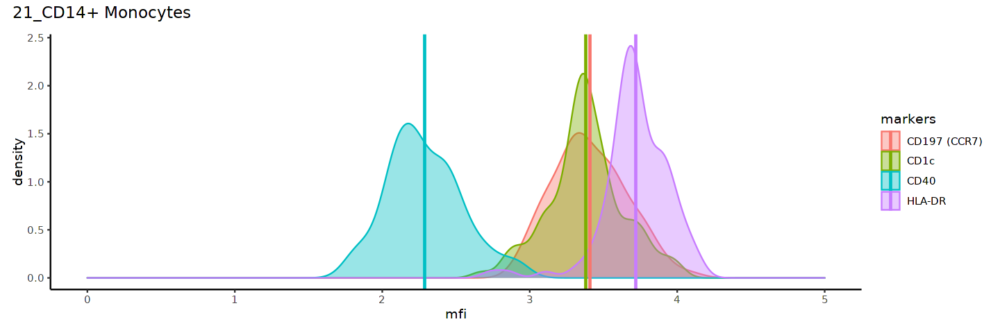

[[1]]

[[2]]

[[3]]


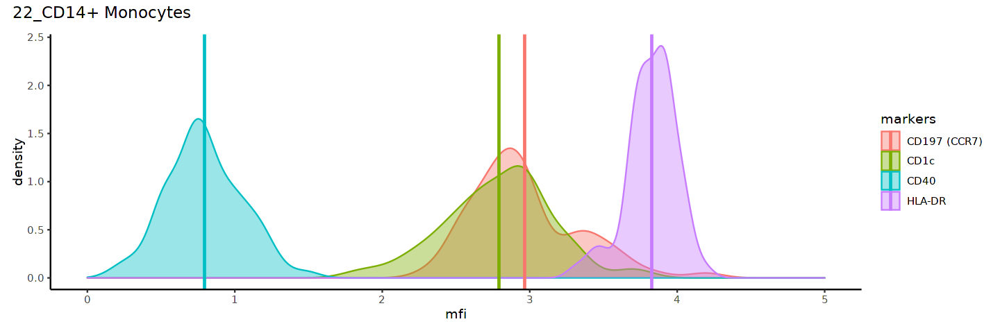

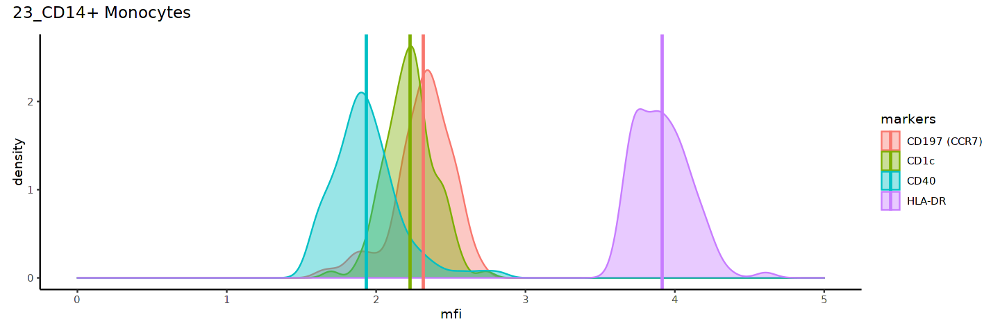

In [314]:
marker = c("HLA-DR", "CD40", "CD197 (CCR7)", "CD1c")
lapply(grep("^(21|22|23)_CD14", clusters_unique, value = T), function(x){
    
    c <- mfi_long %>% filter(markers %in% c(marker) & FlowSOM_meta_spe_anno == x) %>% 
     group_by(FlowSOM_meta_spe_anno, markers) %>% 
     mutate(grp.mean = mean(mfi))
    
    gg1 <- ggplot(c, aes(x=mfi, fill=markers, color=markers)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=markers),linetype="solid", size = 1) + 
        theme_classic() + 
        xlim(0,5)
  
    gg1 + plot_annotation(title = x)

    })

### CD14 monocytes - group 2

[[1]]

[[2]]


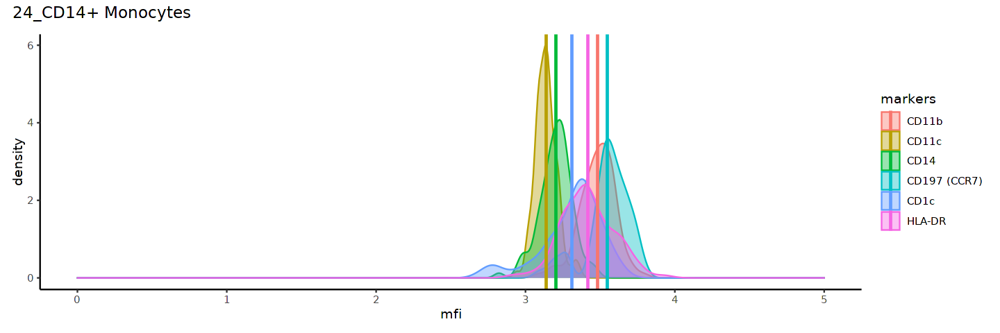

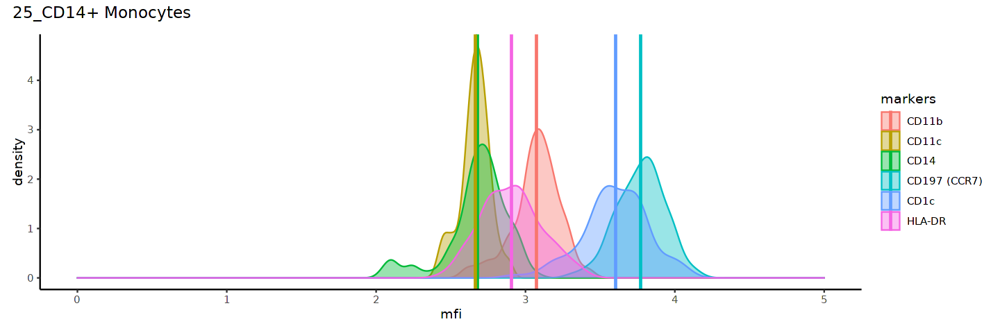

In [315]:
marker = c("HLA-DR", "CD11b", "CD14", "CD11c","CD197 (CCR7)", "CD1c")
lapply(grep("^(24|25)_CD14", clusters_unique, value = T), function(x){
    
    c <- mfi_long %>% filter(markers %in% c(marker) & FlowSOM_meta_spe_anno == x) %>% 
     group_by(FlowSOM_meta_spe_anno, markers) %>% 
     mutate(grp.mean = mean(mfi))
    
    gg1 <- ggplot(c, aes(x=mfi, fill=markers, color=markers)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=markers),linetype="solid", size = 1) + 
        theme_classic() + 
        xlim(0,5)
  
    gg1 + plot_annotation(title = x)

    })

### CD16 monocytes 

[[1]]

[[2]]


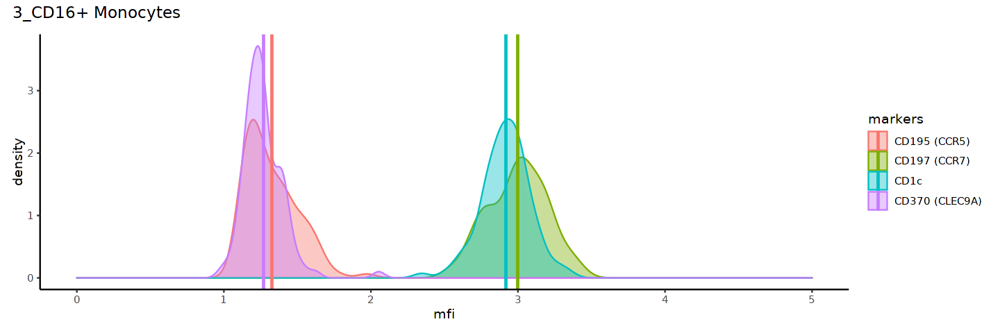

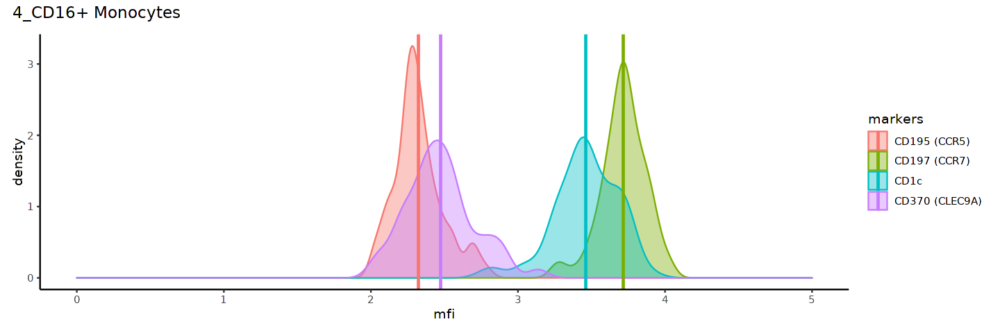

In [318]:
marker = c("CD195 (CCR5)", "CD370 (CLEC9A)", "CD197 (CCR7)", "CD1c")
lapply(grep("^(3|4)_CD16", clusters_unique, value = T), function(x){
    
    c <- mfi_long %>% filter(markers %in% c(marker) & FlowSOM_meta_spe_anno == x) %>% 
     group_by(FlowSOM_meta_spe_anno, markers) %>% 
     mutate(grp.mean = mean(mfi))
    
    gg1 <- ggplot(c, aes(x=mfi, fill=markers, color=markers)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=markers),linetype="solid", size = 1) + 
        theme_classic() + 
        xlim(0,5)
  
    gg1 + plot_annotation(title = x)

    })

### Intermediate monocytes - group 1

[[1]]

[[2]]


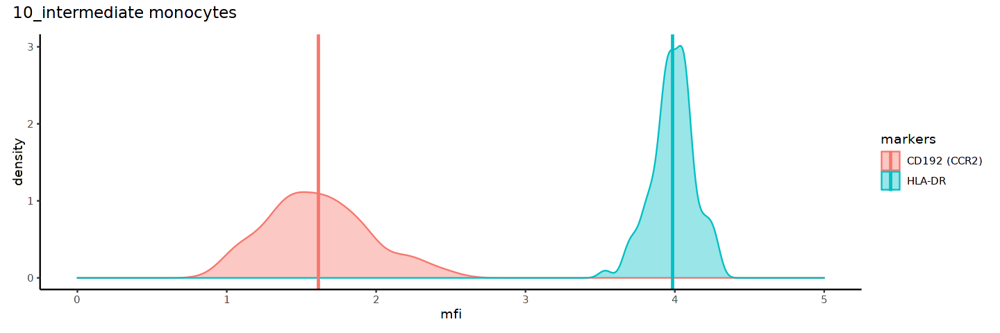

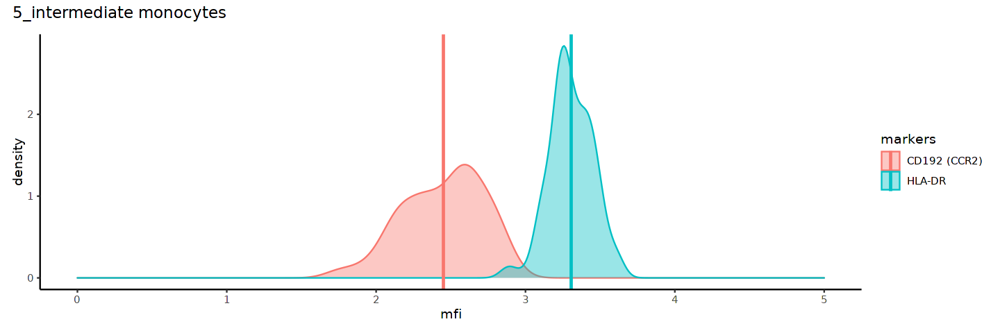

In [317]:
marker = c("HLA-DR", "CD192 (CCR2)")
lapply(grep("^(5|10)_intermediate", clusters_unique, value = T), function(x){
    
    c <- mfi_long %>% filter(markers %in% c(marker) & FlowSOM_meta_spe_anno == x) %>% 
     group_by(FlowSOM_meta_spe_anno, markers) %>% 
     mutate(grp.mean = mean(mfi))
    
    gg1 <- ggplot(c, aes(x=mfi, fill=markers, color=markers)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=markers),linetype="solid", size = 1) + 
        theme_classic() + 
        xlim(0,5)
  
    gg1 + plot_annotation(title = x)

    })

### NK cells - group 1

In [333]:
mfi_meta %>% select(file.batchID)

[[1]]

[[2]]


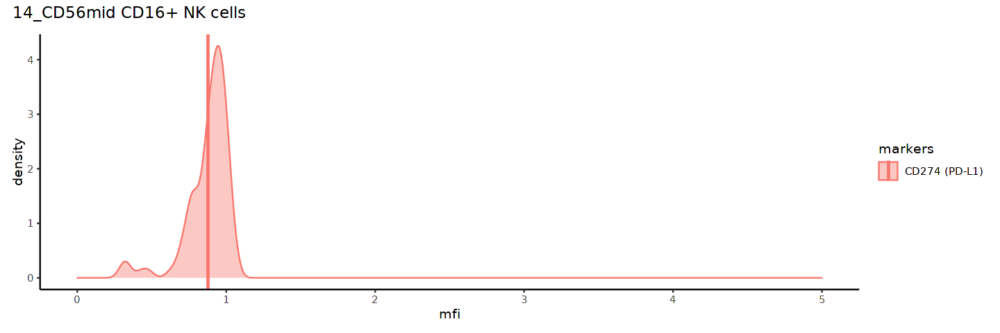

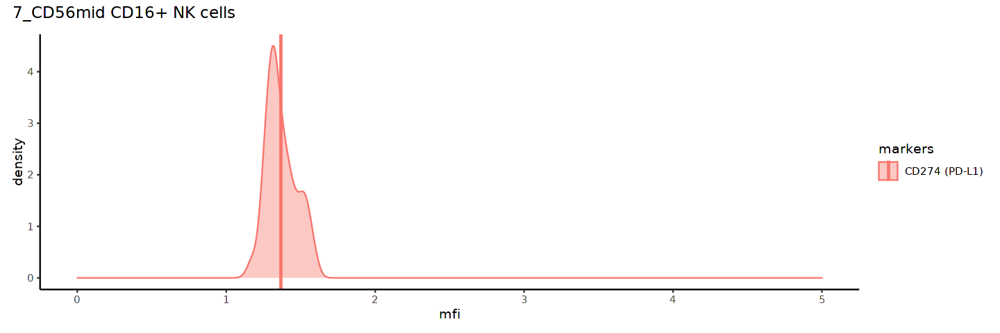

In [339]:
marker = c("CD274 (PD-L1)")
lapply(grep("^(7|14)_CD56", clusters_unique, value = T), function(x){
    
    c <- mfi_long %>% filter(markers %in% c(marker) & FlowSOM_meta_spe_anno == x) %>% 
     group_by(FlowSOM_meta_spe_anno, markers) %>% 
     mutate(grp.mean = mean(mfi))
    
    gg1 <- ggplot(c, aes(x=mfi, fill=markers, color=markers)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=markers),linetype="solid", size = 1) + 
        theme_classic() + 
        xlim(0,5)
  
    gg1 + plot_annotation(title = x)

    })

[[1]]

[[2]]


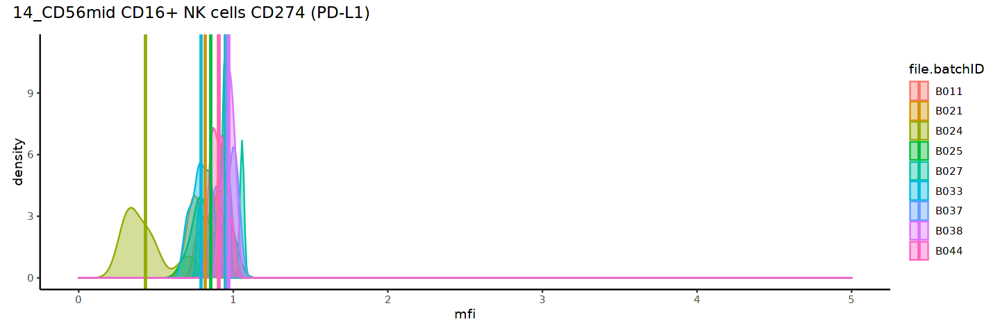

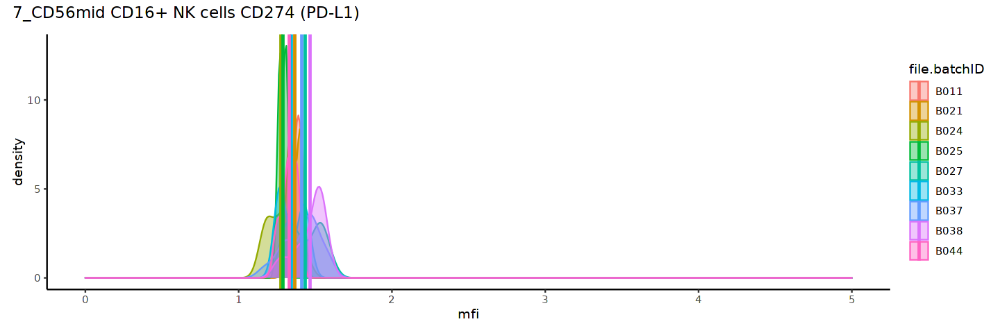

In [341]:
# check batch differences
marker = c("CD274 (PD-L1)")
lapply(grep("^(7|14)_CD56", clusters_unique, value = T), function(x){
    
    c <- mfi_meta %>% filter(markers %in% c(marker) & FlowSOM_meta_spe_anno == x) %>% 
     group_by(FlowSOM_meta_spe_anno, file.batchID) %>% 
     mutate(grp.mean = mean(mfi))
    
    gg1 <- ggplot(c, aes(x=mfi, fill=file.batchID, color=file.batchID)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=file.batchID),linetype="solid", size = 1) + 
        theme_classic() + 
        xlim(0,5)
  
    gg1 + plot_annotation(title = paste(x, "CD274 (PD-L1)"))

    })

### NK cells - group 2

Warning message:
“Removed 37 rows containing non-finite values (stat_density).”
Warning message:
“Removed 60 rows containing missing values (geom_vline).”


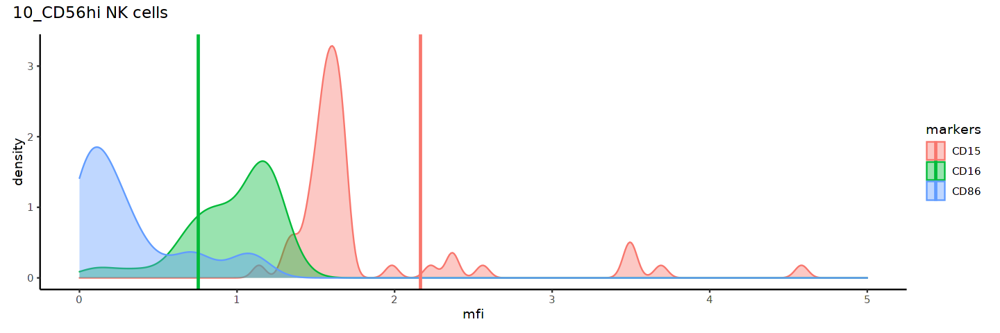

[[1]]

[[2]]

[[3]]


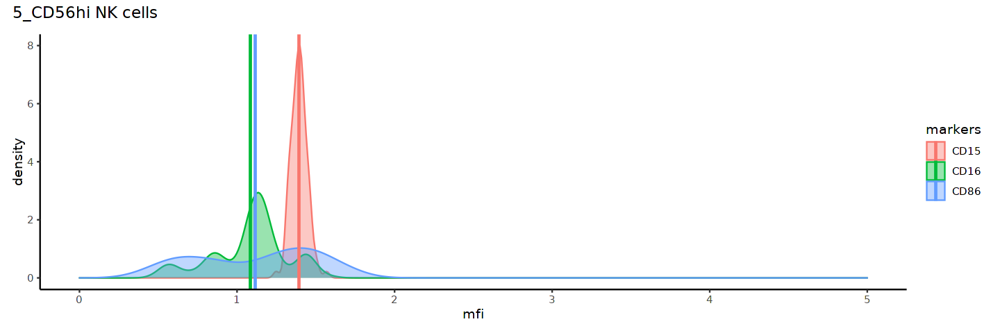

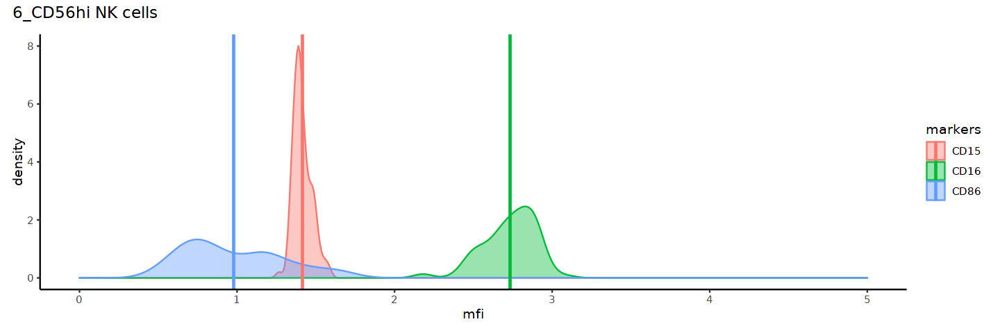

In [326]:
marker = c("CD16", "CD86", "CD15")
lapply(grep("^(5|6|10)_CD56", clusters_unique, value = T), function(x){
    
    c <- mfi_long %>% filter(markers %in% c(marker) & FlowSOM_meta_spe_anno == x) %>% 
     group_by(FlowSOM_meta_spe_anno, markers) %>% 
     mutate(grp.mean = mean(mfi))
    
    gg1 <- ggplot(c, aes(x=mfi, fill=markers, color=markers)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=markers),linetype="solid", size = 1) + 
        theme_classic() + 
        xlim(0,5)
  
    gg1 + plot_annotation(title = x)

    })

In [ ]:
fig.size(5,5)

df <- data.frame(celltype = names(table(fm_norm_pm1_final$FlowSOM_meta_spe_anno)),
                 cellnumber = as.numeric(table(fm_norm_pm1_final$FlowSOM_meta_spe_anno))
                 )

ggplot(df %>% filter(grepl("CD14", df$celltype)), aes(x=reorder(celltype, -cellnumber), y=log10(cellnumber)))+
  geom_bar(stat="identity")+
  theme_classic() + 
  ylab("Number of cells (log10)") + 
  xlab("") + 
  theme(axis.text.x = element_text(angle = 45, vjust = 0.8, hjust=0.8)) +
  theme(text=element_text(size=10))
  
ggplot(df %>% filter(grepl("CD16.*Mono", df$celltype)), aes(x=reorder(celltype, -cellnumber), y=log10(cellnumber)))+
  geom_bar(stat="identity")+
  theme_classic() + 
  ylab("Number of cells (log10)") + 
  xlab("") + 
  theme(axis.text.x = element_text(angle = 45, vjust = 0.8, hjust=0.8)) +
  theme(text=element_text(size=10))

ggplot(df %>% filter(grepl("intermediate", df$celltype)), aes(x=reorder(celltype, -cellnumber), y=log10(cellnumber)))+
  geom_bar(stat="identity")+
  theme_classic() + 
  ylab("Number of cells (log10)") + 
  xlab("") + 
  theme(axis.text.x = element_text(angle = 45, vjust = 0.8, hjust=0.8)) +
  theme(text=element_text(size=10))

ggplot(df %>% filter(grepl("NK", df$celltype)), aes(x=reorder(celltype, -cellnumber), y=log10(cellnumber)))+
  geom_bar(stat="identity")+
  theme_classic() + 
  ylab("Number of cells (log10)") + 
  xlab("") + 
  theme(axis.text.x = element_text(angle = 45, vjust = 0.8, hjust=0.8)) +
  theme(text=element_text(size=10))
  

# Compostions
### COVID vs healthy

In [62]:
# reorder cluster leveling
FlowSOM_anno_order <- celltype_freq_meta %>% 
    arrange(celltype) %>% 
    pull(FlowSOM_meta_spe_anno) %>%
    unique()
celltype_freq_meta <- celltype_freq_meta %>% 
    mutate(FlowSOM_meta_spe_anno = factor(FlowSOM_meta_spe_anno, levels = FlowSOM_anno_order))

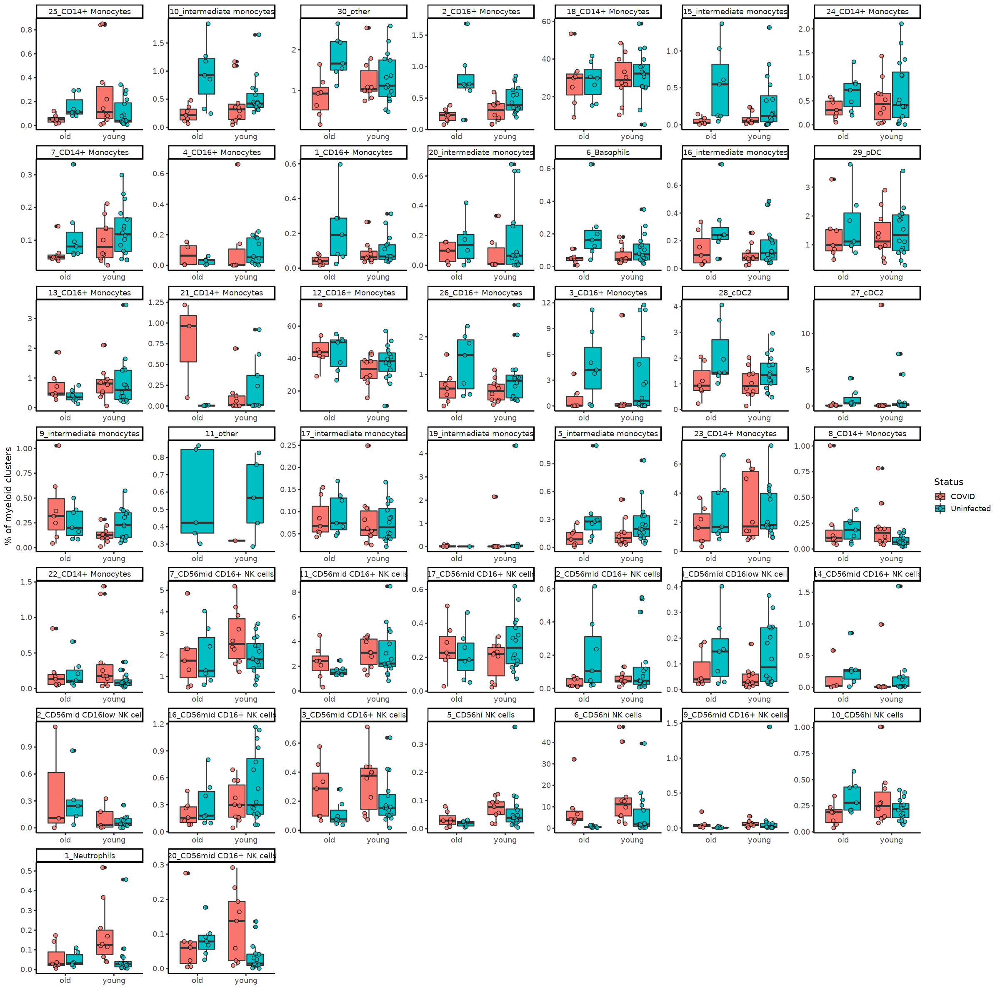

In [525]:
# by cluster
fig.size(20,20)
ggplot(celltype_freq_meta %>% filter(visit == 1), aes(x=age_bin,y=freq_live*100, fill = Status)) + 
geom_boxplot() + 
    geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) +
    facet_wrap(~FlowSOM_meta_spe_anno, scales="free") + 
    theme_classic(base_size = 13) + ylab("% of myeloid clusters") + xlab("") #+ 
    #scale_y_continuous(sec.axis = number, name = "# of cells"))

In [379]:
# wilcox and FC 
df <- matrix(nrow = 0, ncol = 4)
celltype_freq_v1 <- celltype_freq_meta %>% filter(visit == 1)
for (x in clusters_unique){
        yh <- celltype_freq_v1 %>% filter(FlowSOM_meta_spe_anno == x &
                                  age_bin == "young" & Status == "Uninfected") %>% pull(freq_live) 
        yc <- celltype_freq_v1 %>% filter(FlowSOM_meta_spe_anno == x &
                                  age_bin == "young" & Status == "COVID") %>% pull(freq_live) 
        oh <- celltype_freq_v1 %>% filter(FlowSOM_meta_spe_anno == x &
                                  age_bin == "old" & Status == "Uninfected") %>% pull(freq_live) 
        oc <- celltype_freq_v1 %>% filter(FlowSOM_meta_spe_anno == x &
                                  age_bin == "old" & Status == "COVID") %>% pull(freq_live) 
        if (suppressWarnings(!any(lapply(list(yh,yc,oh,oc), is_empty)))){
            fcy <- log2(mean(yc)/mean(yh))
            fco <- log2(mean(oc)/mean(oh))
    
            wily <- wilcox.test(yh, yc)$p.value
            wilo <- wilcox.test(oh, oc)$p.value
            df <- rbind(df, data.frame(cluster = rep(x, 2),
                                   age_bin = c("young", "old"),
                                   pval = c(wily, wilo),
                                   log2FC = c(fcy, fco)))
        
        
        }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_covid_healthy_age_cluster_composition_wilcox.csv")))


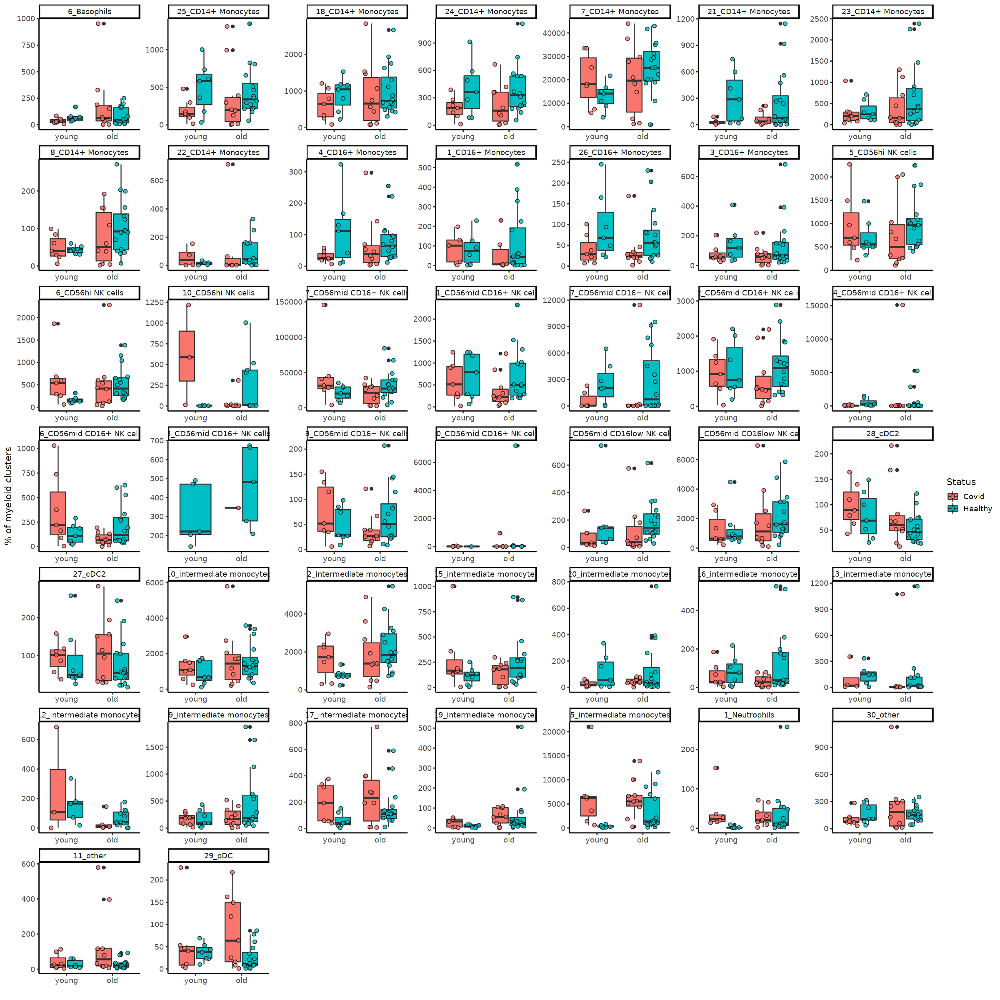

In [838]:
# by cluster, absolute cell counts
fig.size(20,20)
ggplot(celltype_freq_meta %>% filter(visit == 1), aes(x=age_bin,y=N, fill = Status)) + 
geom_boxplot() + 
    geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) +
    facet_wrap(~FlowSOM_meta_spe_anno, scales="free") + 
    theme_classic(base_size = 13) + ylab("% of myeloid clusters") + xlab("") #+ 
    #scale_y_continuous(sec.axis = number, name = "# of cells"))

In [63]:
# by cell type
celltype_freq_meta <- celltype_freq_meta %>% mutate(celltype = str_extract(FlowSOM_meta_spe_anno, "[^_]+$")) %>%
                      group_by(PBID, celltype) %>% mutate(avg_celltype = sum(freq_live))


In [ ]:
fig.size(10,10)

celltype_freq_adj <- celltype_freq_meta %>% select(c(avg_celltype, Status, visit, age_bin)) %>% distinct()
ggplot(celltype_freq_adj %>% filter(visit == 1),aes(x=Status,y=avg_celltype*100, fill = age_bin)) + 
geom_boxplot() + 
    geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) +
facet_wrap(~celltype, scales="free") + theme_classic(base_size = 13) + ylab("% of myeloid") + xlab("") + theme(legend.position = "none")

### Days since symptoms

`geom_smooth()` using method = 'loess' and formula 'y ~ x'

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



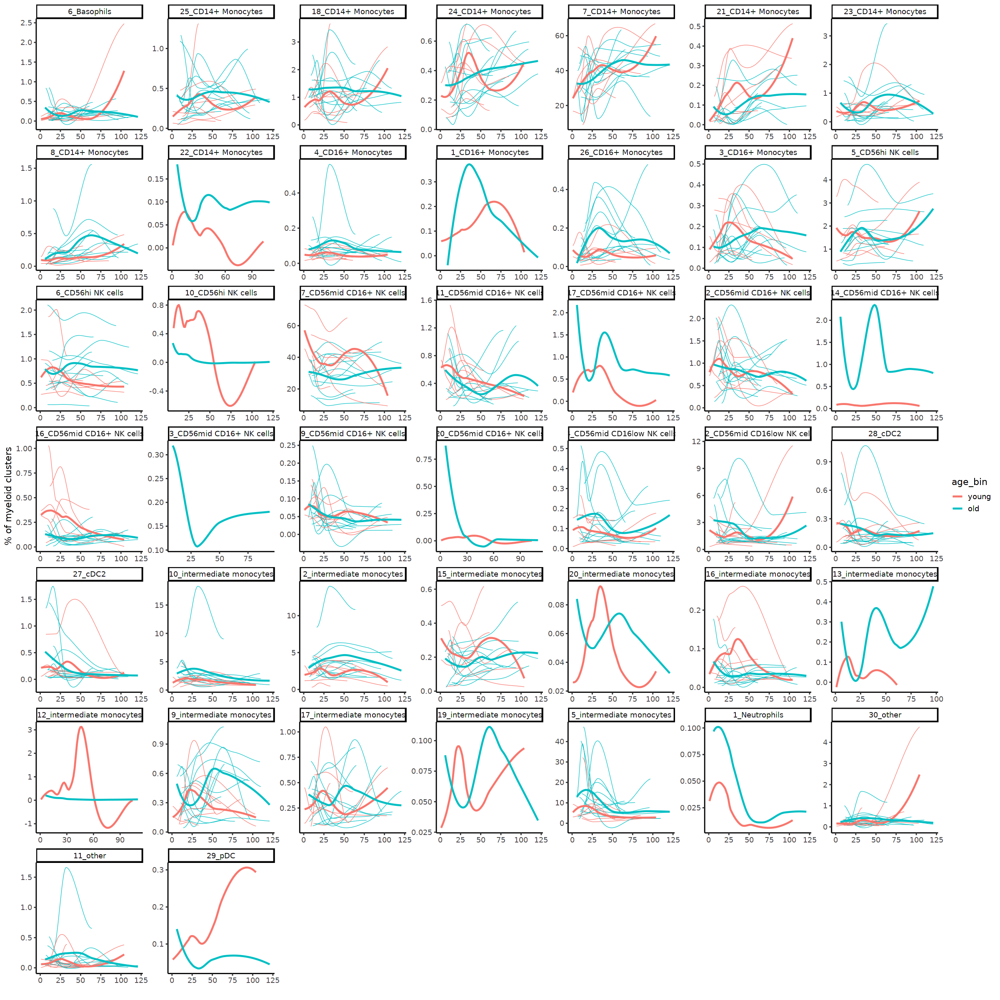

In [852]:
# by cluster
fig.size(20,20)
suppressWarnings(print(
    ggplot(celltype_freq_meta %>% filter(Status == "Covid"), aes(x=days_since_symptoms,y=freq_live*100, group = age_bin)) + 
        geom_smooth(aes(color=age_bin,group = Subject),size=0.25, se=F) + 
        geom_smooth(aes(color=age_bin, group = age_bin),size=1, se=F) + 
        facet_wrap(~FlowSOM_meta_spe_anno, scales="free") + theme_classic(base_size = 13) + ylab("% of myeloid clusters") + xlab("")
        ))

In [ ]:
# by cell type
fig.size(10,10)

celltype_freq_adj <- celltype_freq_meta %>% select(c(avg_celltype, days_since_symptoms, Status, age_bin)) %>% distinct()
suppressWarnings(print(
    ggplot(celltype_freq_adj %>% filter(Status == "Covid"), aes(x=days_since_symptoms,y=avg_celltype*100, group = age_bin)) + 
geom_point(aes(color=age_bin)) + geom_smooth(aes(color=age_bin)) + 
facet_wrap(~celltype, scales="free") + theme_classic(base_size = 13) + ylab("% of myeloid clusters") + xlab("")
))


### COVID infection timepoints

In [382]:
pasc_ids <- celltype_freq_meta %>% filter(Stage == "PASC") %>% pull(Subject) %>% unique()
recov_ids <- celltype_freq_meta %>% filter(Stage == "Recovered") %>% pull(Subject) %>% unique()
celltype_freq_meta <- celltype_freq_meta %>% mutate(Status_pasc = ifelse(Subject %in% pasc_ids, "PASC", 
                                                   ifelse(Subject %in% recov_ids, "Recovered", "Uninfected"))) %>%
                                             mutate(timeperiod = ifelse(days_since_symptoms < 16, "Early", 
                                                   ifelse((15 < days_since_symptoms & days_since_symptoms < 30), "Late", "Recovered")))
celltype_freq_meta$timeperiod <- replace_na(celltype_freq_meta$timeperiod, "Uninfected")


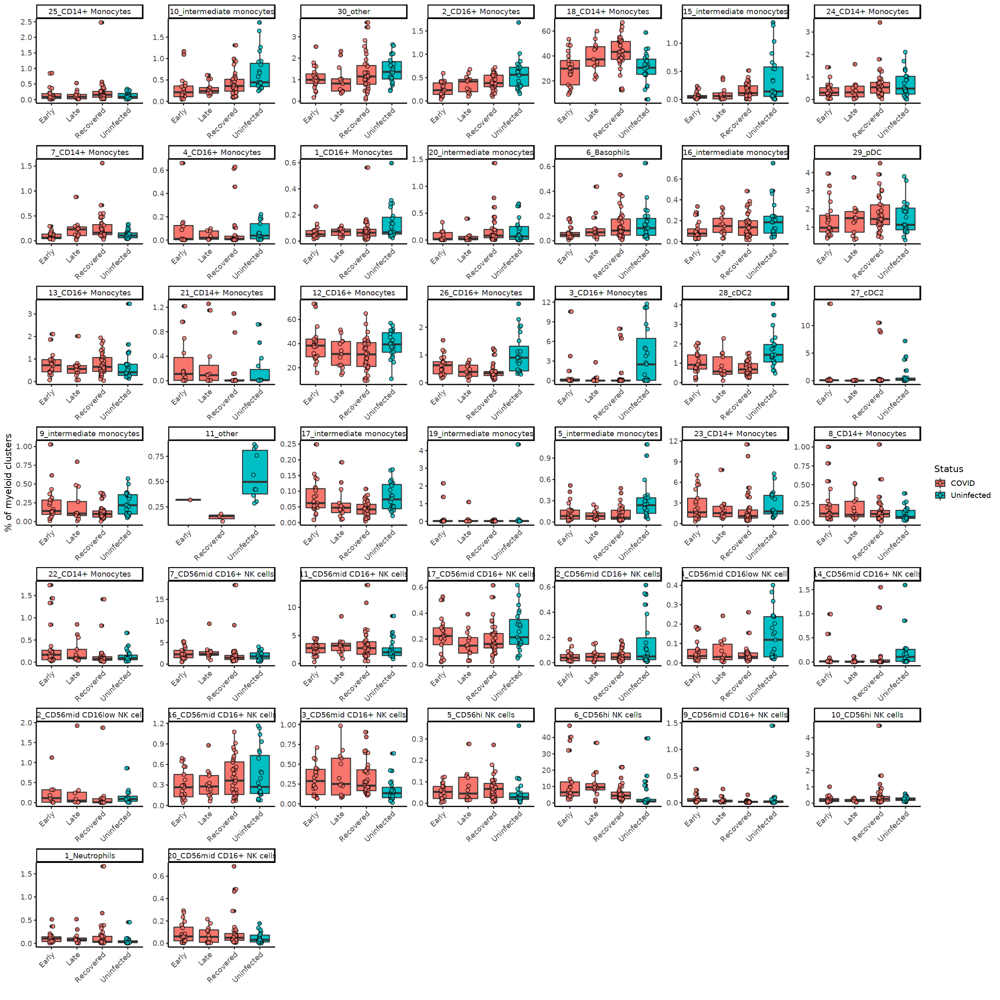

In [580]:
# by cluster
fig.size(20,20)
ggplot(celltype_freq_meta, aes(x=timeperiod,y=freq_live*100, fill = Status)) + 
geom_boxplot() + 
    geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) +
    facet_wrap(~FlowSOM_meta_spe_anno, scales="free") + theme_classic(base_size = 13) + 
    ylab("% of myeloid clusters") + xlab("") + guides(fill=guide_legend(title="Status")) +
    theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

In [383]:
# wilcox and FC 
df <- matrix(nrow = 0, ncol = 4)
for (x in clusters_unique){
        u <- celltype_freq_meta %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Uninfected") %>% pull(freq_live) 
        e <- celltype_freq_meta %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Early") %>% pull(freq_live) 
        l <- celltype_freq_meta %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Late") %>% pull(freq_live) 
        r <- celltype_freq_meta %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Recovered") %>% pull(freq_live) 
        if (suppressWarnings(!any(lapply(list(u,e,l,r), is_empty)))){
            fce <- log2(mean(e)/mean(u))
            fcl <- log2(mean(l)/mean(u))
            fcr <- log2(mean(r)/mean(u))
    
            wile <- wilcox.test(u, e)$p.value
            will <- wilcox.test(u, l)$p.value
            wilr <- wilcox.test(u, r)$p.value
            df <- rbind(df, data.frame(cluster = rep(x, 3),
                                   timepoint = c("Early", "Late", "Recovered"),
                                   pval = c(wile, will, wilr),
                                   log2FC = c(fce, fcl, fcr)))
        
        
        }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_covid_healthy_timepoints_cluster_composition_wilcox.csv")))


In [ ]:
# by cell type
fig.size(10,10)

#celltype_freq_adj <- celltype_freq_meta %>% select(c(avg_celltype, Stage)) %>% distinct()
ggplot(celltype_freq_meta %>% filter(Stage %in% c("Recovered", "PASC")),aes(x=Stage,y=avg_celltype*100, fill = age_bin)) + 
geom_boxplot() + 
    geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) +
facet_wrap(~celltype, scales="free") + theme_classic(base_size = 13) + ylab("% of myeloid") + xlab("") + theme(legend.position = "none")

### PASC vs recovered

In [604]:
table(celltype_freq_meta$Status_pasc, celltype_freq_meta$Sex)

            
             Female Male
  PASC          726    0
  Recovered     790 1276
  Uninfected    406  545

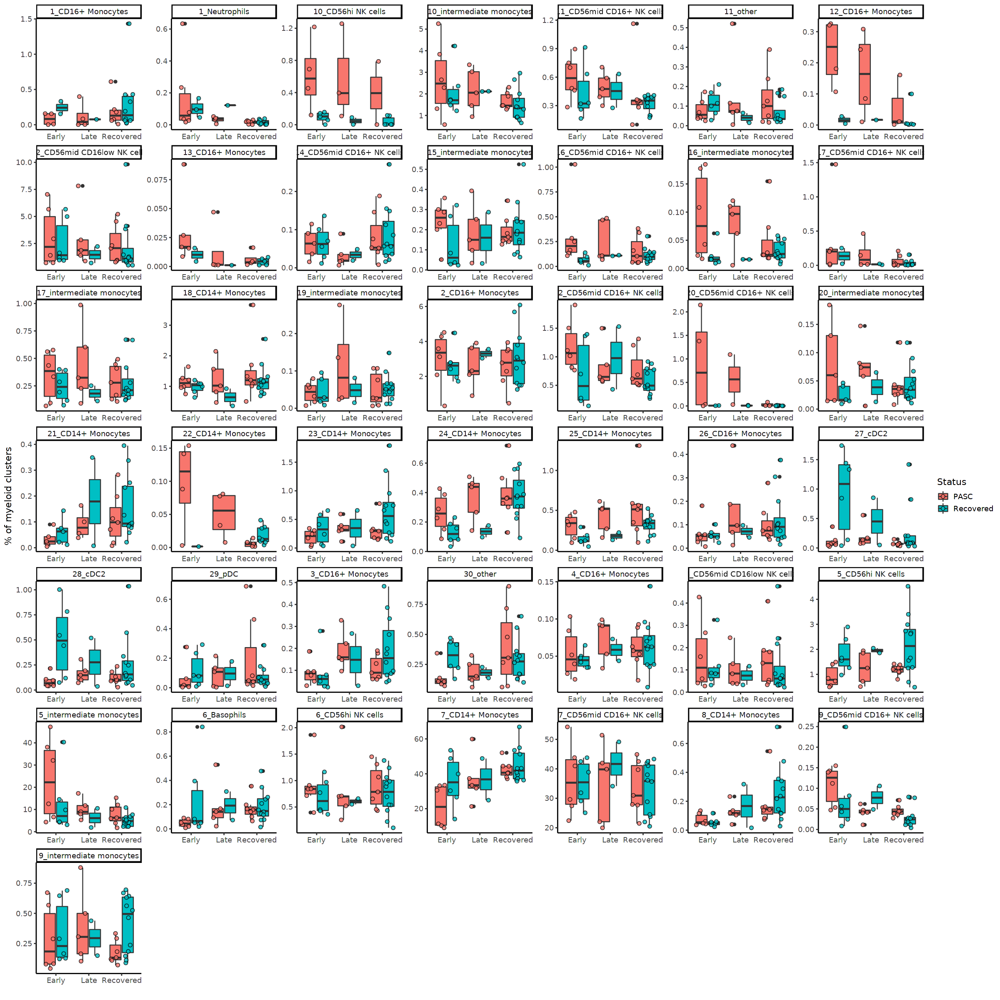

In [385]:
# by cluster
fig.size(20,20)
# only females in PASC group, filter accordingly
celltype_freq_meta_s <- celltype_freq_meta %>% filter(Sex == "Female")
ggplot(celltype_freq_meta_s %>% filter(Status_pasc %in% c("PASC", "Recovered") & Sex == "Female"), aes(x=timeperiod,y=freq_live*100, fill = Status_pasc)) + 
geom_boxplot() + 
    geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) +
facet_wrap(~FlowSOM_meta_spe_anno, scales="free") + theme_classic(base_size = 13) + 
ylab("% of myeloid clusters") + xlab("") + guides(fill=guide_legend(title="Status"))

In [384]:
# wilcox and FC 


df <- matrix(nrow = 0, ncol = 4)

for (x in clusters_unique){
        ep <- celltype_freq_meta_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Early" & Status_pasc == "PASC") %>% pull(freq_live) 
        er <- celltype_freq_meta_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Early" & Status_pasc == "Recovered") %>% pull(freq_live)
        lp <- celltype_freq_meta_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Late" & Status_pasc == "PASC") %>% pull(freq_live)
        lr <- celltype_freq_meta_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Late" & Status_pasc == "Recovered") %>% pull(freq_live)
        rp <- celltype_freq_meta_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Recovered" & Status_pasc == "PASC") %>% pull(freq_live)
        rr <- celltype_freq_meta_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Recovered" & Status_pasc == "Recovered") %>% pull(freq_live)
    
        if (suppressWarnings(!any(lapply(list(ep,er,lp,lr,rp,rr), is_empty)))){
            fce <- log2(mean(ep)/mean(er))
            fcl <- log2(mean(lp)/mean(lr))
            fcr <- log2(mean(rp)/mean(rr))
    
            wile <- wilcox.test(er, ep)$p.value
            will <- wilcox.test(lr, lp)$p.value
            wilr <- wilcox.test(rr, rp)$p.value
            df <- rbind(df, data.frame(cluster = rep(x, 3),
                                   timepoint = c("Early", "Late", "Recovered"),
                                   pval = c(wile, will, wilr),
                                   log2FC = c(fce, fcl, fcr)))
        
        
        }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_PASC_recovered_timepoints_cluster_composition_wilcox.csv")))

In [ ]:
# by cell type
fig.size(10,10)

celltype_freq_adj <- celltype_freq_meta %>% select(c(avg_celltype, Stage)) %>% distinct()
ggplot(celltype_freq_adj %>% filter(Stage %in% c("Early", "Late", "Recovered")),aes(x=Stage,y=avg_celltype*100, fill = Stage)) + 
geom_boxplot() + 
    geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) +
facet_wrap(~celltype, scales="free") + theme_classic(base_size = 13) + ylab("% of myeloid") + xlab("") + theme(legend.position = "none")

### Old vs young

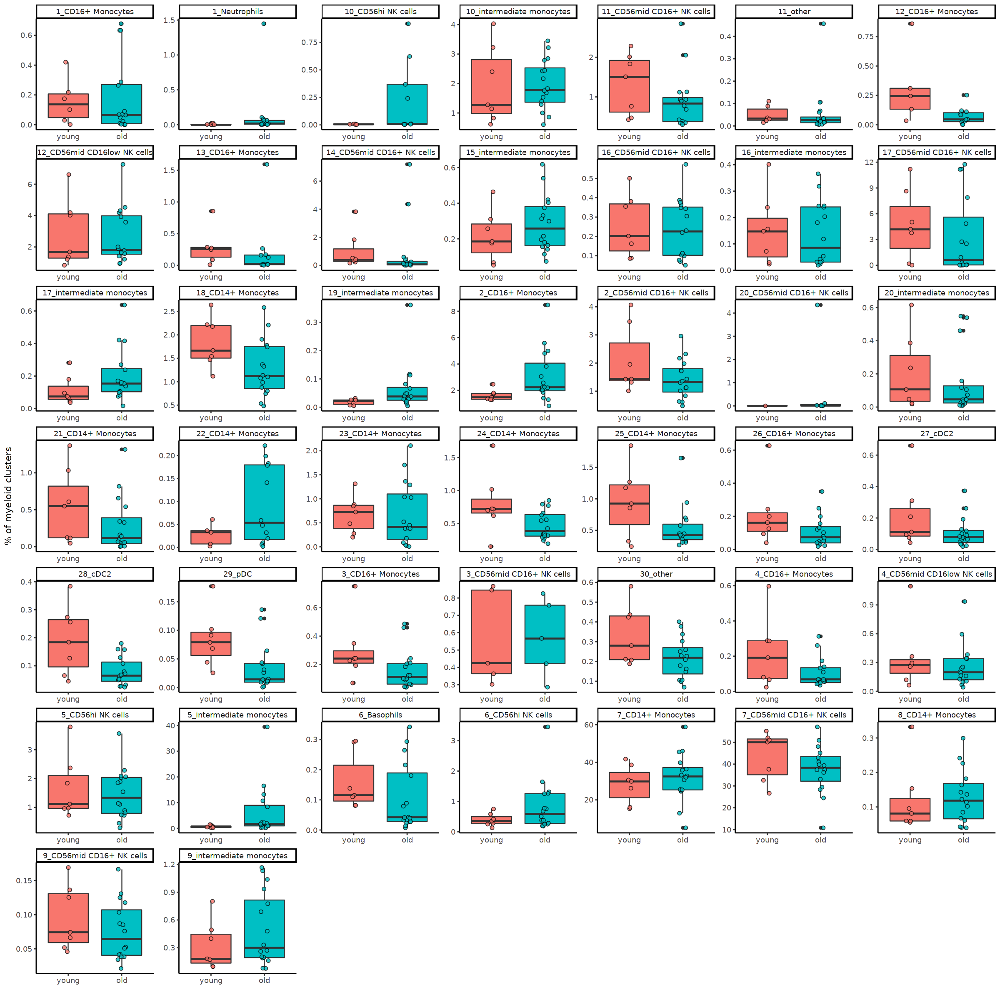

In [386]:
# by cluster
fig.size(20,20)
celltype_freq_meta_u <- celltype_freq_meta %>% filter(Status == "Uninfected")

ggplot(celltype_freq_meta_u %>% filter(Status == "Uninfected"), aes(x=age_bin,y=freq_live*100, fill = age_bin)) + 
geom_boxplot() + 
    geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) +
facet_wrap(~FlowSOM_meta_spe_anno, scales="free") + theme_classic(base_size = 13) + ylab("% of myeloid clusters") + xlab("") + theme(legend.position = "none")

In [387]:
# wilcox and FC 

df <- matrix(nrow = 0, ncol = 3)

for (x in clusters_unique){
        y <- celltype_freq_meta_u %>% filter(FlowSOM_meta_spe_anno == x &
                                  age_bin == "young") %>% pull(freq_live) 
        o <- celltype_freq_meta_u %>% filter(FlowSOM_meta_spe_anno == x &
                                  age_bin == "old") %>% pull(freq_live)

    
        if (suppressWarnings(!any(lapply(list(y,o), is_empty)))){
            fc <- log2(mean(y)/mean(o))

    
            wil <- wilcox.test(y, o)$p.value

            df <- rbind(df, data.frame(cluster = rep(x, 1),
                                   pval = wil,
                                   fc = fc))
        
        
        }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_age_cluster_composition_wilcox.csv")))

In [ ]:
# by cell type
fig.size(10,10)

celltype_freq_adj <- celltype_freq_meta %>% select(c(avg_celltype, age_bin)) %>% distinct()
ggplot(celltype_freq_adj,aes(x=age_bin,y=avg_celltype*100, fill = age_bin)) + 
geom_boxplot() + 
    geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) +
facet_wrap(~celltype, scales="free") + theme_classic(base_size = 13) + ylab("% of myeloid") + xlab("") + theme(legend.position = "none")

# MFI comparisons

In [13]:
# read in single cell mfis
mfi_all_cell <- data.table::fread(file.path(base_dir, glue::glue("{panel}_unsup{panel}_pm1_final_normalized_cells_flowsom_spec.csv"))) %>% 
                            mutate(PBID = stringr::str_extract(sample_id, "[^-]*")) 



In [23]:
# merge with metadata
subjectmeta_mfi <- subjectmeta %>% select(PBID, age_bin, Status, Stage, visit) %>%
                                   distinct()
mfi_all_meta <- left_join(mfi_all_cell, subjectmeta_mfi, by = "PBID") %>% 
                    filter(!(grepl("IMM19",PBID))) %>% mutate(Status = recode(Status,
                                                                   "Covid" = "COVID",
                                                                   "Healthy" = "Uninfected"))

In [24]:
# prep MFI for all cells
mfi_all_long <- mfi_all_meta %>% pivot_longer(cols = CD14_logicle_aligned:CD1c_logicle_aligned,names_to = "markers",values_to = "mfi") %>%
                    mutate(markers = str_replace(markers, "_logicle_aligned", "")) 

In [303]:
# order subclusters 
clusters_unique <- mfi_all_meta %>% 
    pull(FlowSOM_meta_spe_anno) %>%
    unique() 
idx <- clusters_unique %>% 
    stringr::str_extract("_(.*)") %>%
    order()

clusters_unique <- mfi_meta$FlowSOM_meta_spe_anno %>% unique()
markers <- mfi_meta$markers %>% unique()

### COVID vs healthy

In [311]:
# wilcox and FC - MFI healthy vs covid
mfi_meta_v1 <- mfi_meta %>% filter(visit == 1)
df <- matrix(nrow = 0, ncol = 4)
for (x in clusters_unique){
     for (m in markers){
        yh <- mfi_meta_v1 %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  age_bin == "young" & Status == "Uninfected") %>% pull(mfi) 
        yc <- mfi_meta_v1 %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  age_bin == "young" & Status == "COVID") %>% pull(mfi) 
        oh <- mfi_meta_v1 %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  age_bin == "old" & Status == "Uninfected") %>% pull(mfi) 
        oc <- mfi_meta_v1 %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  age_bin == "old" & Status == "COVID") %>% pull(mfi) 
        if (suppressWarnings(!any(lapply(list(yh,yc,oh,oc), is_empty)))){
            fcy <- log2(mean(yc)/mean(yh))
            fco <- log2(mean(oc)/mean(oh))
    
            wily <- wilcox.test(yh, yc)$p.value
            wilo <- wilcox.test(oh, oc)$p.value
            df <- rbind(df, data.frame(cluster = rep(x, 2),
                                       marker = rep(m, 2),
                                   age_bin = c("young", "old"),
                                   pval = c(wily, wilo),
                                   log2FC = c(fcy, fco)))
        
        }
    }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_covid_healthy_age_cluster_MFI_wilcox.csv")))

Warning message in eval(expr, envir, enclos):
“NaNs produced”
Warning message in eval(expr, envir, enclos):
“NaNs produced”
Warning message in eval(expr, envir, enclos):
“NaNs produced”


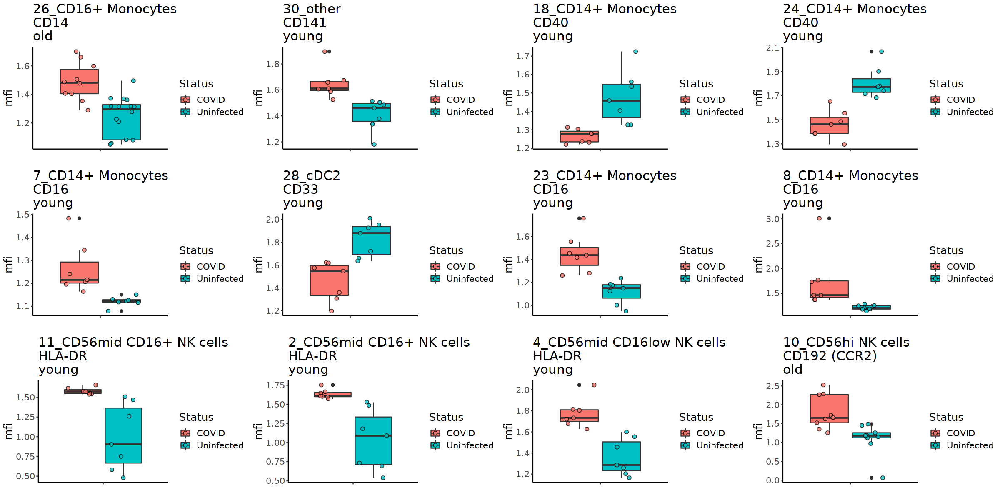

In [312]:
top <- fread(paste0(base_dir, glue::glue("/stats/{panel}_covid_healthy_age_cluster_MFI_wilcox.csv")) )%>% 
                 slice_head(n=12) 

fig.size(10,20)
ggs <- list()
for (i in 1:nrow(top)){
    
    
    clus <- top[i,]$cluster
    marker <- top[i,]$marker
    age <- top[i,]$age_bin
    
    ggs[[i]] <- ggplot(mfi_meta_v1 %>% filter(age_bin == age & FlowSOM_meta_spe_anno == clus & markers == marker), 
           aes(x=markers, y=mfi, fill = Status)) +
        geom_boxplot() + 
        geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) + 
        theme_classic() + theme(axis.text.x = element_blank()) + theme(text = element_text(size=15)) +
        ggtitle(glue::glue("{clus}\n{marker}\n{age}")) + 
        xlab("")
    
    
    
    }
grid.arrange(grobs = ggs, ncol = 4)

In [ ]:
fig.size(10,10)
lapply(clusters_unique[idx][1], function(x){
    ym <- df %>% filter(cluster == x & age_bin == "young") %>% arrange(pval, abs(fc)) %>% 
                 slice_head(n=5) %>% pull(marker)
    om <- df %>% filter(cluster == x & age_bin == "old") %>% arrange(pval, abs(fc)) %>% 
                 slice_head(n=5) %>% pull(marker)

    # ggplot(mfi_meta, aes(x=celltype,y=mfi, fill = Status)) + 
    #     geom_violin() +
    #     facet_wrap(~markers, scales="free") + 
    #     theme_classic() + theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1)) + theme(text = element_text(size=15)) +
    #     ylab("MFI") + xlab("")
    
    gg1 <- ggplot(mfi_all_long %>% filter(age_bin == "young" & FlowSOM_meta_spe_anno == x & markers %in% ym) %>%
                  group_by(Status, markers) %>% mutate(grp.mean = mean(mfi)), aes(x=mfi, fill=Status, color=Status)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=Status),linetype="solid", size = 1) + 
        theme_classic() + 
        facet_wrap(~markers, scales = "free", ncol = 1) + 
        ggtitle("Young")
    gg2 <- ggplot(mfi_all_long %>% filter(age_bin == "old" & FlowSOM_meta_spe_anno == x & markers %in% om)  %>%
                  group_by(Status, markers) %>% mutate(grp.mean = mean(mfi)), aes(x=mfi, fill=Status, color=Status)) +
        geom_density(alpha=0.4) +
        geom_vline(aes(xintercept=grp.mean, color=Status),linetype="solid", size = 1) + 
        theme_classic() + 
        facet_wrap(~markers, scales = "free", ncol = 1) + 
        ggtitle("Old")
    
    gg1 + gg2 + plot_annotation(title = x, theme = theme(plot.title = element_text(size = 25)))
    
    })

In [ ]:
# KS test - covid vs healthy

yc <- mfi_all_long %>% filter(
                                  Status == "COVID" & age_bin == "young") 
yh <- mfi_all_long %>% filter(
                                  Status == "Uninfected" & age_bin == "young")
oc <- mfi_all_long %>% filter(
                                  Status == "COVID" & age_bin == "old")
oh <- mfi_all_long %>% filter(
                                  Status == "Uninfected" & age_bin == "old")
df <- matrix(nrow = 0, ncol = 5)
for (x in clusters_unique){
    print(x)
    yc1 <- yc %>% filter(FlowSOM_meta_spe_anno == x) 
    yh1 <- yh %>% filter(FlowSOM_meta_spe_anno == x)
    oc1 <- oc %>% filter(FlowSOM_meta_spe_anno == x)
    oh1 <- oh %>% filter(FlowSOM_meta_spe_anno == x)
    for (m in markers){
        print(m)
        yc2 <- yc1 %>% filter(markers == m) %>% pull(mfi) 
        yh2 <- yh1 %>% filter(markers == m) %>% pull(mfi)
        oc2 <- oc1 %>% filter(markers == m) %>% pull(mfi)
        oh2 <- oh1 %>% filter(markers == m) %>% pull(mfi)
       
        if (suppressWarnings(!any(lapply(list(yc,yh,oc,oh), is_empty)))){
            fcy <- log2(mean(yc2)/mean(yh2))
            fco <- log2(mean(oc2)/mean(oh2))
            
    
            wily <- ks.test(yh2, yc2)$p.value
            wilo <- ks.test(oh2, oc2)$p.value
            
            df <- rbind(df, data.frame(cluster = rep(x, 2),
                                       marker = rep(m, 2),
                                   timepoint = c("young", "old"),
                                   pval = c(wily, wilo),
                                   fc = c(fcy, fco)))
    
    
        }  
    }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_PASC_recovered_timepoints_cluster_MFI_kstest.csv")))

In [ ]:
# prep data for pasc and timepoint comparisons 
pasc_ids <- mfi_all_long %>% filter(Stage == "PASC") %>% pull(Subject) %>% unique()
recov_ids <- mfi_all_long %>% filter(Stage == "Recovered") %>% pull(Subject) %>% unique()
mfi_all_long <- mfi_all_long %>% mutate(Status_pasc = ifelse(Subject %in% pasc_ids, "PASC", 
                                        ifelse(Subject %in% recov_ids, "Recovered", "Uninfected"))) %>%
                                 mutate(timeperiod = ifelse(days_since_symptoms < 16, "Early", 
                                        ifelse((15 < days_since_symptoms & days_since_symptoms < 30), "Late", "Recovered")))
mfi_all_long$timeperiod <- replace_na(mfi_all_long$timeperiod, "Uninfected")




In [328]:
# prep data for pasc and timepoint comparisons 
pasc_ids <- mfi_meta %>% filter(Stage == "PASC") %>% pull(Subject) %>% unique()
recov_ids <- mfi_meta %>% filter(Stage == "Recovered") %>% pull(Subject) %>% unique()
mfi_meta <- mfi_meta %>% mutate(Status_pasc = ifelse(Subject %in% pasc_ids, "PASC", 
                                        ifelse(Subject %in% recov_ids, "Recovered", "Uninfected"))) %>%
                                 mutate(timeperiod = ifelse(days_since_symptoms < 16, "Early", 
                                        ifelse((15 < days_since_symptoms & days_since_symptoms < 30), "Late", "Recovered")))
mfi_meta$timeperiod <- replace_na(mfi_meta$timeperiod, "Uninfected")


### COVID infection timepoints

In [ ]:
# wilcox and FC - covid timepoints

df <- matrix(nrow = 0, ncol = 5)
for (x in clusters_unique){
    
    for (m in markers){
        u <- mfi_meta %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Uninfected") %>% pull(mfi) 
        e <- mfi_meta %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Early") %>% pull(mfi)
        l <- mfi_meta %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Late") %>% pull(mfi)
        r <- mfi_meta %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Recovered") %>% pull(mfi)
       

    
        if (suppressWarnings(!any(lapply(list(u,e,l,r), is_empty)))){
            fce <- log2(mean(e)/mean(u))
            fcl <- log2(mean(l)/mean(u))
            fcr <- log2(mean(r)/mean(u))
            
    
            wile <- wilcox.test(e, u)$p.value
            will <- wilcox.test(l, u)$p.value
            wilr <- wilcox.test(r, u)$p.value
            
            df <- rbind(df, data.frame(cluster = rep(x, 3),
                                       marker = rep(m, 3),
                                       timeperiod = c("Early", "Late", "Recovered"),
                                       pval = c(wile, will, wilr),
                                       log2FC = c(fce, fcl, fcr)))
    
    
        }  
    }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_covid_timepoints_cluster_MFI_wilcox.csv")))

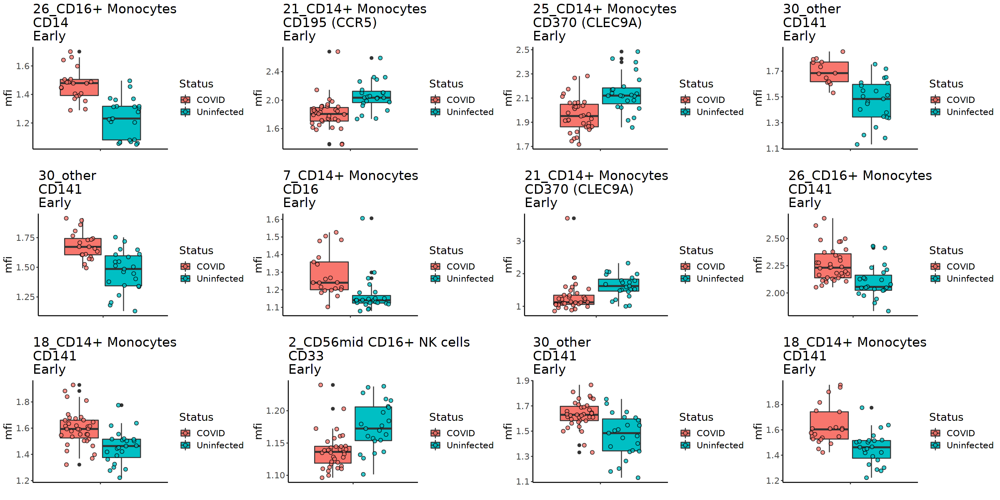

In [351]:
top <- fread(paste0(base_dir, glue::glue("/stats/{panel}_covid_timepoints_cluster_MFI_wilcox.csv")) ) %>% 
                 slice_head(n=12) 

fig.size(10,20)
ggs <- list()
for (i in 1:nrow(top)){
    
    
    clus <- top[i,]$cluster
    marker <- top[i,]$marker
    time <- top[i,]$timeperiod
    
    ggs[[i]] <- ggplot(mfi_meta %>% filter(timeperiod %in% c(time, "Uninfected") & FlowSOM_meta_spe_anno == clus & markers == marker), 
           aes(x=markers, y=mfi, fill = Status)) +
        geom_boxplot() + 
        geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) + 
        theme_classic() + theme(axis.text.x = element_blank()) + theme(text = element_text(size=15)) +
        ggtitle(glue::glue("{clus}\n{marker}\n{timeperiod}")) + 
        xlab("")
    
    
    
    }
grid.arrange(grobs = ggs, ncol = 4)

In [ ]:
# wilcox and FC - covid timepoints

df <- matrix(nrow = 0, ncol = 5)
for (x in clusters_unique){
    for (m in markers){
        u <- mfi_all_long %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Uninfected") %>% pull(mfi) 
        e <- mfi_all_long %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Early") %>% pull(mfi)
        l <- mfi_all_long %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Late") %>% pull(mfi)
        r <- mfi_all_long %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Recovered") %>% pull(mfi)
       

    
        if (suppressWarnings(!any(lapply(list(u,e,l,r), is_empty)))){
            fce <- log2(mean(e)/mean(u))
            fcl <- log2(mean(l)/mean(u))
            fcr <- log2(mean(r)/mean(u))
            
    
            wile <- ks.test(e, u)$p.value
            will <- ks.test(l, u)$p.value
            wilr <- ks.test(r, u)$p.value
            
            df <- rbind(df, data.frame(cluster = rep(x, 3),
                                       marker = rep(m, 3),
                                       timepoint = c("early", "young", "recovered"),
                                       pval = c(wile, will, wilr),
                                       fc = c(fce, fcl, fcr)))
    
    
        }  
    }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_COVID_timepoints_cluster_MFI_kstest.csv")))

### PASC vs recovered

In [368]:
x <- "30_other"
m <- "CD40"
rp <- mfi_meta_s %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Recovered" & Status_pasc == "PASC") %>% pull(mfi)
rr <- mfi_meta_s %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Recovered" & Status_pasc == "Recovered") %>% pull(mfi)
log2(mean(rp)/mean(rr))
wilcox.test(rp, rr)

[1] 0.1607391


	Wilcoxon rank sum exact test

data:  rp and rr
W = 80, p-value = 0.0004763
alternative hypothesis: true location shift is not equal to 0


In [374]:
# wilcox and FC - pasc vs recovered timepoints
# upreg is PASC
mfi_meta_s <- mfi_meta %>% filter(Sex == "Female")
df <- matrix(nrow = 0, ncol = 5)
for (x in clusters_unique){
    for (m in markers){
        ep <- mfi_meta_s %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Early" & Status_pasc == "PASC") %>% pull(mfi) 
        er <- mfi_meta_s %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Early" & Status_pasc == "Recovered") %>% pull(mfi)
        lp <- mfi_meta_s %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Late" & Status_pasc == "PASC") %>% pull(mfi)
        lr <- mfi_meta_s %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Late" & Status_pasc == "Recovered") %>% pull(mfi)
        rp <- mfi_meta_s %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Recovered" & Status_pasc == "PASC") %>% pull(mfi)
        rr <- mfi_meta_s %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  timeperiod == "Recovered" & Status_pasc == "Recovered") %>% pull(mfi)
    
        if (suppressWarnings(!any(lapply(list(ep,er,lp,lr,rp,rr), is_empty)))){
            fce <- log2(mean(ep)/mean(er))
            fcl <- log2(mean(lp)/mean(lr))
            fcr <- log2(mean(rp)/mean(rr))
    
            wile <- wilcox.test(er, ep)$p.value
            will <- wilcox.test(lr, lp)$p.value
            wilr <- wilcox.test(rr, rp)$p.value
            df <- rbind(df, data.frame(cluster = rep(x, 3),
                                       marker = rep(m, 3),
                                       timeperiod = c("Early", "Late", "Recovered"),
                                       pval = c(wile, will, wilr),
                                       log2FC = c(fce, fcl, fcr)))
        
    
    
        }  
    }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_PASC_recovered_cluster_MFI_wilcox.csv")))

Warning message in eval(expr, envir, enclos):
“NaNs produced”
Warning message in eval(expr, envir, enclos):
“NaNs produced”
Warning message in eval(expr, envir, enclos):
“NaNs produced”


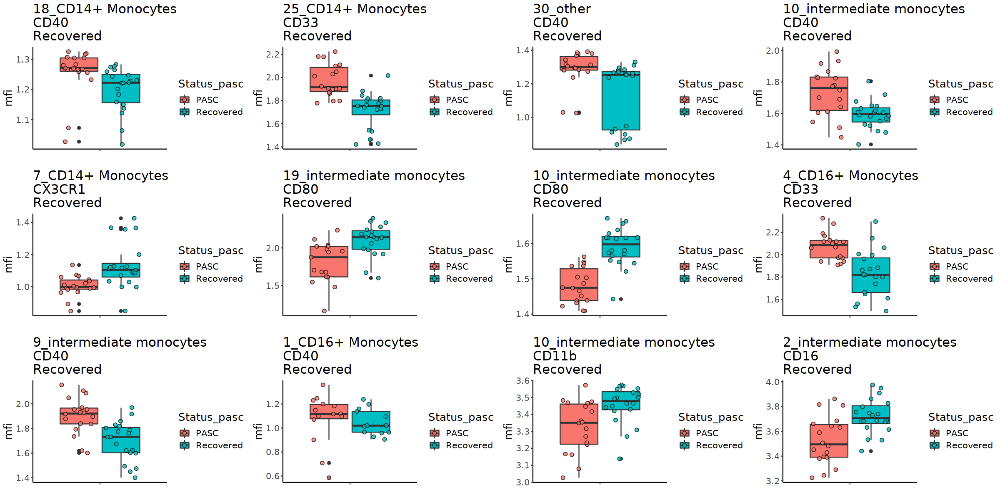

In [375]:
top <- fread(paste0(base_dir, glue::glue("/stats/{panel}_PASC_recovered_cluster_MFI_wilcox.csv")) ) %>% 
                 slice_head(n=12) 

fig.size(10,20)
ggs <- list()
for (i in 1:nrow(top)){
    
    clus <- top[i,]$cluster
    marker <- top[i,]$marker
    timeperiod <- top[i,]$timeperiod
    
    ggs[[i]] <- ggplot(mfi_meta_s %>% filter(timeperiod == timeperiod & FlowSOM_meta_spe_anno == clus &
                                           markers == marker & Status_pasc %in% c("PASC", "Recovered")), 
           aes(x=markers, y=mfi, fill = Status_pasc)) +
        geom_boxplot() + 
        geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) + 
        theme_classic() + theme(axis.text.x = element_blank()) + theme(text = element_text(size=15)) +
        ggtitle(glue::glue("{clus}\n{marker}\n{timeperiod}")) + 
        xlab("")
    
    
    
    }
grid.arrange(grobs = ggs, ncol = 4)

In [ ]:
# wilcox and FC - pasc vs recovered timepoints

mfi_all_long_s <- mfi_all_long %>% filter(Sex == "Female")
df <- matrix(nrow = 0, ncol = 5)
for (x in clusters_unique){
    for (m in markers){
        ep <- mfi_all_long_s %>% filter(FlowSOM_meta_spe_anno == x & marker = m &
                                  timeperiod == "Early" & Status_pasc == "PASC") %>% pull(mfi) 
        er <- mfi_all_long_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Early" & Status_pasc == "Recovered") %>% pull(mfi)
        lp <- mfi_all_long_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Late" & Status_pasc == "PASC") %>% pull(mfi)
        lr <- mfi_all_long_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Late" & Status_pasc == "Recovered") %>% pull(mfi)
        rp <- mfi_all_long_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Recovered" & Status_pasc == "PASC") %>% pull(mfi)
        rr <- mfi_all_long_s %>% filter(FlowSOM_meta_spe_anno == x &
                                  timeperiod == "Recovered" & Status_pasc == "Recovered") %>% pull(mfi)
    
        if (suppressWarnings(!any(lapply(list(ep,er,lp,lr,rp,rr), is_empty)))){
            fce <- log2(mean(ep)/mean(er))
            fcl <- log2(mean(lp)/mean(lr))
            fcr <- log2(mean(rp)/mean(rr))
    
            wile <- ks.test(er, ep)$p.value
            will <- ks.test(lr, lp)$p.value
            wilr <- ks.test(rr, rp)$p.value
            df <- rbind(df, data.frame(cluster = rep(x, 3),
                                       marker = rep(m, 3),
                                       timepoint = c("early", "late", "recovered"),
                                       pval = c(wile, will, wilr),
                                       fc = c(fce, fcl, fcr)))
        
    
    
        }  
    }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_PASC_recovered_cluster_MFI_kstest.csv")))

### Old vs young

In [376]:
# wilcox and FC 
# upreg is young
df <- matrix(nrow = 0, ncol = 4)
mfi_meta_u <- mfi_meta %>% filter(Status == "Uninfected")
for (x in clusters_unique){
    for (m in markers){
        y <- mfi_meta_u %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  age_bin == "young") %>% pull(mfi) 
        o <- mfi_meta_u %>% filter(FlowSOM_meta_spe_anno == x & markers == m &
                                  age_bin == "old") %>% pull(mfi)

    
        if (suppressWarnings(!any(lapply(list(y,o), is_empty)))){
            fc <- log2(mean(y)/mean(o))

            wil <- wilcox.test(y, o)$p.value
            df <- rbind(df, data.frame(cluster = x,
                                       marker = m,
                                   pval = wil,
                                   log2FC = fc))
    
        }    
    }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_age_cluster_MFI_wilcox.csv")))

Warning message in eval(expr, envir, enclos):
“NaNs produced”
Warning message in eval(expr, envir, enclos):
“NaNs produced”


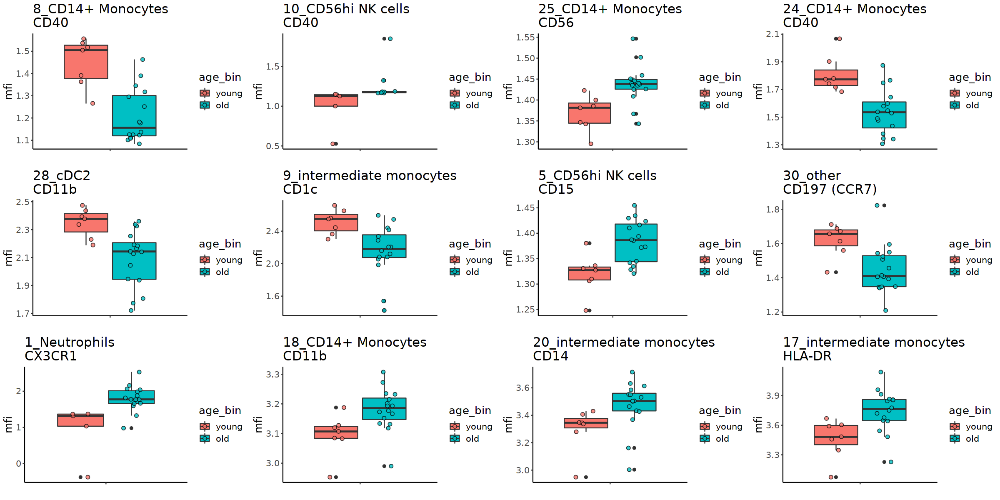

In [378]:
top <- fread(paste0(base_dir, glue::glue("/stats/{panel}_age_cluster_MFI_wilcox.csv")) ) %>% 
                 slice_head(n=12) 

fig.size(10,20)
ggs <- list()
for (i in 1:nrow(top)){
    
    clus <- top[i,]$cluster
    marker <- top[i,]$marker
    
    ggs[[i]] <- ggplot(mfi_meta_u %>% filter(FlowSOM_meta_spe_anno == clus & markers == marker), 
           aes(x=markers, y=mfi, fill = age_bin)) +
        geom_boxplot() + 
        geom_jitter(shape=21,position = position_jitterdodge(jitter.width = .3,dodge.width = .8),alpha=.8,size=2) + 
        theme_classic() + theme(axis.text.x = element_blank()) + theme(text = element_text(size=15)) +
        ggtitle(glue::glue("{clus}\n{marker}")) + 
        xlab("")
    
    
    
    }
grid.arrange(grobs = ggs, ncol = 4)

In [ ]:
# wilcox and FC 
# upreg is young
df <- matrix(nrow = 0, ncol = 4)
mfi_all_long_u <- mfi_all_long_u %>% filter(Status == "Uninfected")
for (x in clusters_unique){
        y <- mfi_all_long_u %>% filter(FlowSOM_meta_spe_anno == x & marker == m &
                                  age_bin == "young" & Status_pasc == "PASC") %>% pull(freq_live) 
        o <- mfi_all_long_u %>% filter(FlowSOM_meta_spe_anno == x & marker == m &
                                  timeperiod == "old" & Status_pasc == "Recovered") %>% pull(freq_live)

    
        if (suppressWarnings(!any(lapply(list(y,o), is_empty)))){
            fc <- log2(mean(y)/mean(o))

            wil <- ks.test(y, o)$p.value
            df <- rbind(df, data.frame(cluster = x,
                                       marker = m
                                   pval = wil,
                                   fc = fc))
        
        
        }
}

fwrite(df %>% arrange(pval, abs(fc)), 
       paste0(base_dir, glue::glue("/stats/{panel}_age_cluster_MFI_kstest.csv")))